# Task overview

In this exercise your goal will be to implement simple Transformer architecture "from scratch" (using only basic layers like nn.Embedding, nn.Linear, ReLU, softmax, einsum, etc.), train it on a toy problem, analyze results with and without some key components of Transformer, and visualize attention weights.

## Dataset

Dataset generation is already implemented below.

Each example is a sequence of tokens. Length of each sequence is 64 tokens, and each token is represented by a number 0 <= X < 16 (that is, we have a vocabulary of size 16).

For each token in the sequence your model should predict how many times this specific token occured in this sequence before or not. The label is a sequence of 64 numbers from 0 to 9 (inclusive), indicating the number of times the specific token appeared in the sequence. If a specific token appeared more than 9 times in the sequence before (this will be extremely rare) then the label is '9'.
You should use this dataset as a classification task, i.e. for each token output a probability for each of 10 possible labels.

For example, for sequence

[3 5 3 0 2 3 5 4 2 1 5 5]

the desired output is

[0 0 1 0 0 2 1 0 1 0 2 3] .

## Model implementation (1.5 points)

You should implement a *simplified* Transformer architecture with only the encoder. You can read the original paper introducing Transformer here for more details: https://arxiv.org/pdf/1706.03762.pdf 

The model will consist of:
* learnable, randomly initialized embeddings (you can just use nn.Embedding)
* positional encoding
* a number of encoding blocks, each consisting of
 * multi-head attention (wrapped in residual connection, see the image below)
 * feed-forward layer (wrapped in residual connection, see the image below)
* linear layer to get the output probabilities

Below you can see a version of Figure 1 from the paper representing this simplified model. Notice the lack of the right branch of the original model, including "Masked Multi-Head Attention". Notice also the lack of "Norm", which is LayerNorm used in the original model.

The general structure is already provided in the code. You have to implement those classes and functions:
* get_positional_encoding
* Attention
* FeedForward
* EncoderBlock

EncoderModel is already implemented. You can change it if you need it for visualizations etc.

## Model training (1 point)

The training loop is already implemented. In every step we generate a new training batch and train on it. You have to decide what model parameters to use, and what learning parameters to use.

Your model should achieve more than 80% accuracy on the test set (possibly much more), with accuracy defined as percentage of tokens classified correctly (token-level accuracy, not sequence-level accuracy).

Briefly discuss the training and achieved accuracy compared to your expectations. Discuss also in what situations your model makes mistakes.

## Experiments (1 point)

Train three additional models:
* one with positional encoding removed
* one with attention mechanism removed
* one with feed forward layer removed
* (optionally: one with both attention mechanism removed and positional encoding removed )

Those models *don't* have to achieve 80% accuracy.

Notice their accuracy on the test set and explain the difference (if any) between accuracy and training of those ablation models and the full model.

Produce sample predictions on examples from the test set with those ablation models and the main model. Briefly discuss those, e.g. what those models have learned, and why?

## Visualizations (0.5 points)

Make a simple visualization of attention weights of the main model. As an example, you can visualize for a given sequence, for a specific token, which other tokens it paid attention to with each attention head and/or each attention layer.

For those visualizations you can change the dataset (and retrain the model) to sequences of shorter size. Please keep the ratio of number of tokens to sequence length the same. E.g. you can use 8 tokens in sequences of length 32.

( Optionally: Do the same visualization also for the model without positional encoding. )

Briefly discuss those attention weights, especially compared to your expectations.

## Tips and tricks

* I recommend reading:
 * the original paper Attention is All You Need: https://arxiv.org/pdf/1706.03762.pdf
 * this blog-post explaining Transformer with illustrations: http://jalammar.github.io/illustrated-transformer/ 
* All models should train very quickly. If you use colab.research.google.com, and you have a GPU accelerator, then the model should definitely take less than 10 minutes reach 80% accuracy.
* About implementing multi-head attention:
 * I really recommend using torch.einsum . There are examples in https://numpy.org/doc/stable/reference/generated/numpy.einsum.html , in particular look at "Tensor contraction". This will especially help with reducing the number of reshapes/permutations/transpositions for matrix multiplications.
 * You can implement separate (parameterless) functions split_heads and merge_heads, which take a tensor and number of heads.
* About implementing positional encoding:
 * The original paper uses "sin" on even dimensions and "cos" on odd dimensions. However, the order doesn't matter - you can just as well generate "sin" and "cos" separately and concatenate them. If you look at "Illustrated Transformer" blog post above, you can see one graphic generated by concatenating sin/cos parts, and one graphic generated by interleaving sin/cos parts. Both methods work equally well, and concatenation is generally easier to implement.
* About general implementation:
 * If something is not working, check the output of each module separately.
 * If something is not working, check the output predictions of your model.

## Simplifications

If you find some parts of the task too hard you can do one of the following simplifications. Keep in mind that your score will be reduced appropriately; but this may enable you to proceed with experiments. Those techniques may also help you debug your model.
* If you have trouble training the model then try to generate a dataset with less tokens and smaller sequence length. It may be easier to spot a bug in your code then, or tune hyperparameters of the model.
* If you have trouble implementing positional encoding, then you could implement learnable positional encoding: that is, an additional nn.Embedding layer which takes a position of the token (instead of the token itself) and returns an embedding for this particular position.
* If you have trouble implementing multi-head attention, then you could implement just a single head attention, without any splitting and concatenation. (This may also help you to understand the method, and implement multi-head attention later.)

## Picture below:
The representation of simpplified model to be implemented. Compare it with Figure 1 in Attention is All You Need paper,  https://arxiv.org/pdf/1706.03762.pdf .


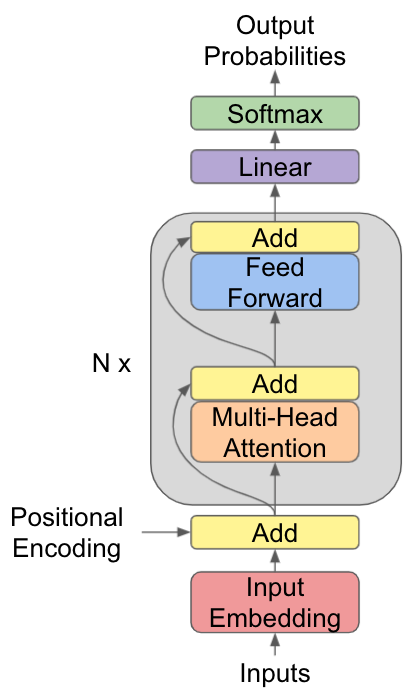

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from time import time

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print('device type', DEVICE)

device type cuda


In [2]:
N_TOKENS = 16
SEQ_LEN = 64

MAX_COUNT = 9
OUTPUT_DIM = MAX_COUNT + 1

def get_single_example(n_tokens=None, seqlen=None):
  if n_tokens is None:
    n_tokens = N_TOKENS
  if seqlen is None:
    seqlen = SEQ_LEN
  seq = np.random.randint(low=0, high=n_tokens, size=(seqlen,))
  label = [min(list(seq[:i]).count(seq[i]), MAX_COUNT) for i, x in enumerate(seq)]
  label = np.array(label)
  return seq, label

seq, label = get_single_example()
print('Sequence:', seq)
print('Labels:', label)
print('Sequence and labels interleaved:\n', np.stack((seq, label)).transpose())

Sequence: [ 9  4 15 11 11 10  3 14  2  2 15  8 12 11  1  9 14 12 11 15  2 14  4 11
 11  5 10  9 14  2  8 10 13  7  5 10  4  7  1 11 13  3  3 14  7  5  0  5
  5  9 11 14 11  3  5 10 13  0  5  0 13 12 15  7]
Labels: [0 0 0 0 1 0 0 0 0 1 1 0 0 2 0 1 1 1 3 2 2 2 1 4 5 0 1 2 3 3 1 2 0 0 1 3 2
 1 1 6 1 1 2 4 2 2 0 3 4 3 7 5 8 3 5 4 2 1 6 2 3 2 3 3]
Sequence and labels interleaved:
 [[ 9  0]
 [ 4  0]
 [15  0]
 [11  0]
 [11  1]
 [10  0]
 [ 3  0]
 [14  0]
 [ 2  0]
 [ 2  1]
 [15  1]
 [ 8  0]
 [12  0]
 [11  2]
 [ 1  0]
 [ 9  1]
 [14  1]
 [12  1]
 [11  3]
 [15  2]
 [ 2  2]
 [14  2]
 [ 4  1]
 [11  4]
 [11  5]
 [ 5  0]
 [10  1]
 [ 9  2]
 [14  3]
 [ 2  3]
 [ 8  1]
 [10  2]
 [13  0]
 [ 7  0]
 [ 5  1]
 [10  3]
 [ 4  2]
 [ 7  1]
 [ 1  1]
 [11  6]
 [13  1]
 [ 3  1]
 [ 3  2]
 [14  4]
 [ 7  2]
 [ 5  2]
 [ 0  0]
 [ 5  3]
 [ 5  4]
 [ 9  3]
 [11  7]
 [14  5]
 [11  8]
 [ 3  3]
 [ 5  5]
 [10  4]
 [13  2]
 [ 0  1]
 [ 5  6]
 [ 0  2]
 [13  3]
 [12  2]
 [15  3]
 [ 7  3]]


In [3]:
import math
import torch.nn.functional as F

class Attention(nn.Module):
  def __init__(self, hidden_dim, num_heads):
    super(Attention, self).__init__()
    self.num_heads = num_heads
    self.hidden_dim = hidden_dim

    self.att_projections = nn.ModuleList(
        [nn.Linear(hidden_dim * num_heads, hidden_dim * num_heads),
         nn.Linear(hidden_dim * num_heads, hidden_dim * num_heads), 
         nn.Linear(hidden_dim * num_heads, hidden_dim * num_heads)])
    
    self.output_projection = nn.Linear(hidden_dim * num_heads, hidden_dim)

  def calc_attention(self, query_vs, key_vs, value_vs):
    d_k = self.hidden_dim
    scores = torch.matmul(query_vs, key_vs.transpose(-2, -1)) / math.sqrt(d_k)
    att_weights = F.softmax(scores, dim = -1)

    return torch.matmul(att_weights, value_vs), att_weights

  def forward(self, x):
    # x shape: (seqlen, batch, hiddendim)
    
    batch_size = x.size(1)
    x = x.permute(1, 0, 2)
    x = x.repeat(1, 1, self.num_heads).to(DEVICE)

    att_vecs = []
    for proj, att_in in zip(self.att_projections, (x, x, x)):
      att_vec = proj(att_in).view(batch_size, -1, self.num_heads, self.hidden_dim)
      att_vec = att_vec.transpose(1, 2)  
      att_vecs.append(att_vec) 
    query_vs, key_vs, value_vs = att_vecs
    
    att_res, att_weights = self.calc_attention(query_vs, key_vs, value_vs)
    att_res = att_res.transpose(1, 2).contiguous()
    att_res = att_res.view(batch_size, -1, self.num_heads * self.hidden_dim)
    return self.output_projection(att_res).permute([1, 0, 2]), att_weights

class FeedForward(nn.Module):
  def __init__(self, hidden_dim, d_ff):
    super(FeedForward, self).__init__()
    self.ff_layer = nn.Sequential(nn.Linear(hidden_dim, d_ff), 
                                  nn.ReLU(), 
                                  nn.Linear(d_ff, hidden_dim))

  def forward(self, x):
    # x shape: (seqlen, batch, hiddendim)
    x = x.permute([1, 0, 2])
    return self.ff_layer(x).permute([1, 0, 2])

class EncoderLayer(nn.Module):
  def __init__(self, hidden_dim, d_ff, num_heads, use_attention=True,
               use_feedforward=True):
    super(EncoderLayer, self).__init__()
    self.use_attention = use_attention
    self.use_feedforward = use_feedforward
    self.attention_heads = Attention(hidden_dim, num_heads)
    self.feed_forward = FeedForward(hidden_dim, d_ff)

  def forward(self, x):
    # x shape: (seqlen, batch, hiddendim)
    att_weights = None
    if self.use_attention:
      att_x, att_weights = self.attention_heads(x)
      x = x + att_x
    
    if self.use_feedforward:
      ff_x = self.feed_forward(x)
      x = x + ff_x

    return x, att_weights

def get_positional_encoding(n_positions, n_dimensions):
  positional_encoding = np.zeros((n_positions, n_dimensions))

  positions = np.expand_dims(np.arange(0, n_positions), axis=1) 
  divs = np.exp(np.arange(0, n_dimensions, 2) * 
                -(math.log(10000.0) / n_dimensions))

  positional_encoding[:, 0::2] = np.sin(positions * divs)
  positional_encoding[:, 1::2] = np.cos(positions * divs)

  # output shape: (seqlen, hiddendim)
  return torch.tensor(positional_encoding, dtype=torch.float, device=DEVICE)

class EncoderModel(nn.Module):
  def __init__(self, input_dim, hidden_dim, d_ff, output_dim, n_layers,
               num_heads, use_attention=True, use_feedforward=True,
               use_positional=True):
    super(EncoderModel, self).__init__()
    
    self._use_positional = use_positional
    self.embedding_layer = nn.Embedding(input_dim, hidden_dim)
    self.layers = nn.ModuleList([
          EncoderLayer(hidden_dim, d_ff, num_heads, use_attention,
                       use_feedforward) for i in range(n_layers)])
    self.output_layer = nn.Linear(hidden_dim, output_dim)

  def forward(self, x, return_att_weights=False):
    # x shape: (seqlen, batch)
    hidden = self.embedding_layer(x)
    # hidden shape: (seqlen, batch, hiddendim)

    if self._use_positional:
      positional_encoding = get_positional_encoding(
          n_positions=hidden.shape[0], n_dimensions=hidden.shape[-1])
      # reshaping to (seqlen, 1, hiddendim)
      positional_encoding = torch.reshape(
          positional_encoding, (hidden.shape[0], 1, hidden.shape[-1]))
      hidden = hidden + positional_encoding
    
    list_att_weights = []
    for layer in self.layers:
      hidden, att_weights = layer(hidden)
      list_att_weights.append(att_weights)
    
    result = self.output_layer(hidden)

    if return_att_weights:
      return result, list_att_weights
    else:
      return result

## This is training loop and test set generation.

In [4]:
TEST_SIZE = 128

test_examples = [get_single_example() for i in range(TEST_SIZE)]

# Transpositions are used, because the convention in PyTorch is to represent
# sequence tensors as <seq_len, batch_size> instead of <batch_size, seq_len>.
test_X = torch.tensor([x[0] for x in test_examples],
                      device=DEVICE).transpose(0, 1)
test_Y = torch.tensor([x[1] for x in test_examples],
                      device=DEVICE).transpose(0, 1)

## Functions generating plots for model analysis.

In [5]:
import pandas as pd
import seaborn as sn
import random

def get_errors_plot(pred, target):
  """
  Creates two plots for the model's error analysis.
  The first plot shows batch error's sizes' distribution per position in the 
  sequence. 
  The second plot shows the distribution of the target's values where the error
  occurred per position in the sequence. It also depicts the mean target value
  per position using a green bar plot.

  :param pred:   shape <output_dim, batch_size>
  :param target: shape <output_dim, batch_size>
  """
  diff = (pred - target)
  targs_mean = torch.mean(target.float(), dim=1)
  # List of tuples '(output_pos, error_size)', but only for error sizes != 0.
  err_size_per_pos = []
  mean_targ_per_pos = []  # list of mean target values per position
  # List of tuples '(output_pos, target_value)', but only for target values that
  # didn't match prediction.
  wrong_targets = []
  for i in range(diff.size(0)):
    mean_targ_per_pos.append(targs_mean[i].item())
    for j in range(diff.size(1)):
      if diff[i][j].item() != 0:
        err_size_per_pos.append((i, diff[i][j].item()))
        wrong_targets.append((i, target[i][j].item()))

  plots_width = int(0.3125 * SEQ_LEN)

  df = pd.DataFrame(err_size_per_pos, columns=['position', 'error'])
  df_err_dist = df.groupby(['position', 'error']).size().reset_index(name='counts')

  fig1, ax1 = plt.subplots(figsize=(plots_width,5), dpi= 80)
  ax1.grid(color='lightgray', linestyle='dashed', linewidth=1, zorder=0)
  ax1.scatter(x=df_err_dist.position, y=df_err_dist.error, c=df_err_dist.counts, s=df_err_dist.counts*3, zorder=5)
  ax1.set_xticks(range(0, SEQ_LEN))
  ax1.set_yticks(range(-10, 11))
  ax1.set_title("Distribution of errors for position in sequence")
  ax1.set_xlabel("Position in sequence")
  ax1.set_ylabel("Error size")

  df2 = pd.DataFrame(wrong_targets, columns=['position', 'target'])
  df2_targets_err = df2.groupby(['position', 'target']).size().reset_index(name='counts')

  fig2, ax2 = plt.subplots(figsize=(plots_width,5), dpi= 80)

  ax2.grid(color='lightgray', linestyle='dashed', linewidth=1, zorder=0)
  ax2.bar([i for i in range(len(mean_targ_per_pos))], mean_targ_per_pos, color='green', alpha=0.1, zorder=1)
  ax2.scatter(x=df2_targets_err.position, y=df2_targets_err.target, c=df2_targets_err.counts, s=df2_targets_err.counts*3, zorder=2)

  ax2.set_xticks(range(0, SEQ_LEN))
  ax2.set_yticks(range(0, 11))
  ax2.set_title("Distribution of targets where error occurred for position in sequence")
  ax2.set_xlabel("Position in sequence")
  ax2.set_ylabel("Target value where error occured")

  plt.show()

def get_att_weights_plot(att_weights, trainset, num_heads):
  layer_no = 0
  trainset = trainset.transpose(0, 1).cpu().numpy()
  example = random.randint(0, trainset.shape[0])
  plot_width = int(6.5 * num_heads)
  for i in range(len(att_weights)):
    fig, axs = plt.subplots(1, num_heads)
    fig.suptitle(f'Attention weights for encoding layer: {i + 1}')
    fig.set_size_inches(plot_width, 5)

    head_no = 0
    enc_layer_att_w = att_weights[i].cpu().detach().numpy()
    for head_att_w in enc_layer_att_w[example]:
      ax = axs[head_no]
      sn.heatmap(head_att_w, square=True, ax=ax, xticklabels=trainset[example], yticklabels=trainset[example])
      ax.set_title(f'Attention weights for head: {head_no + 1}')
      head_no += 1
    
    plt.show()


## Training loop modifications

I extended the training loop with parameters enabling generating plots for model analysis.

In [6]:
def train_model(model, lr, num_steps, batch_size, 
                plot_errors=False, plot_att_weights=False):
  model.to(DEVICE)

  start_time = time()
  accs = []
  
  loss_function = nn.CrossEntropyLoss()
  optimizer = optim.Adam(model.parameters(), lr=lr)

  for step in range(num_steps):  
    batch_examples = [get_single_example() for i in range(batch_size)]

    batch_X = torch.tensor([x[0] for x in batch_examples],
                           device=DEVICE
                           ).transpose(0, 1)
    batch_Y = torch.tensor([x[1] for x in batch_examples],
                           device=DEVICE).transpose(0, 1)

    model.train()
    model.zero_grad()
    logits = model(batch_X)
    loss = loss_function(logits.reshape(-1, OUTPUT_DIM), batch_Y.reshape(-1))
    loss.backward()
    optimizer.step()

    if step % (num_steps//100) == 0 or step == num_steps - 1:
      # Printing a summary of the current state of training every 1% of steps.
      model.eval()
      if plot_att_weights:
        predicted_logits, att_weights = model.forward(
            test_X, 
            return_att_weights=True
        )
      else:
        predicted_logits = model.forward(test_X)

      predicted_logits = predicted_logits.reshape(-1, OUTPUT_DIM)

      if step % (num_steps//10) == 0 or step == num_steps - 1:
        if plot_errors:
          get_errors_plot(
              torch.argmax(predicted_logits, dim=-1).view(-1, TEST_SIZE), 
              test_Y
          )
        
        if plot_att_weights:
          get_att_weights_plot(att_weights, test_X, N_HEADS)
        
      test_acc = (
          torch.sum(torch.argmax(predicted_logits, dim=-1) == test_Y.reshape(-1))
          / test_Y.reshape(-1).shape[0])
      print('step', step, 'out of', num_steps)
      print('loss train', float(loss))
      print('accuracy test', float(test_acc))
      print()
      accs.append(test_acc)
  print('\nTRAINING TIME:', time()-start_time)
  model.eval()
  return accs

## Main model training

### Model parameters selection
*For every described experiment I chose batch size equal to 32 and number of steps to equal 5000.*

For the main model, first I decided to choose model parameters analogous to those from the "Attention Is All You Need" paper. The model achieved an accuracy of 97-99%.

Next, I tried to lower parameters to see if they would impact the model's performance. With 4 attention heads and 4 encoding layers model achieved similar accuracy of 98-99%. Towards the end loss was a little bit unstable, so I decreased the learning rate from $1E-4$ to $1E-5$, but it took model 10,000 steps to achieve an accuracy of 97%, so in the final model I stayed with parameters shown below.

### Error analysis
Plots show that the model tends to make more mistakes towards the end of the sequence. When mistaken, the model slightly tends to predict lower values than greater, but the error size rarely exceeds 1. The hardest sequences for the model are those where target values for position are exceptionally greater than the mean, values lower than mean most of the time are predicted correctly.


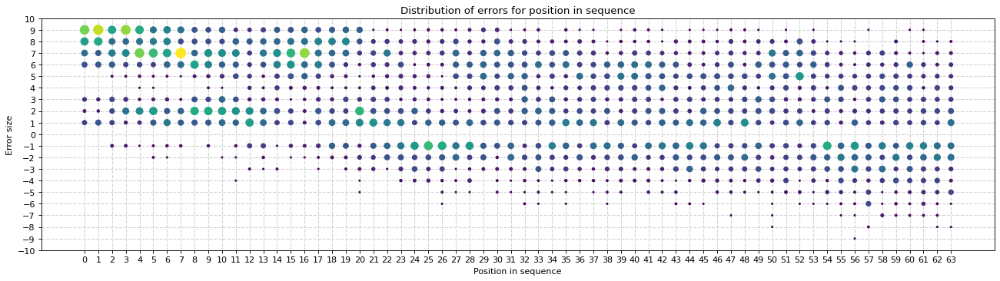

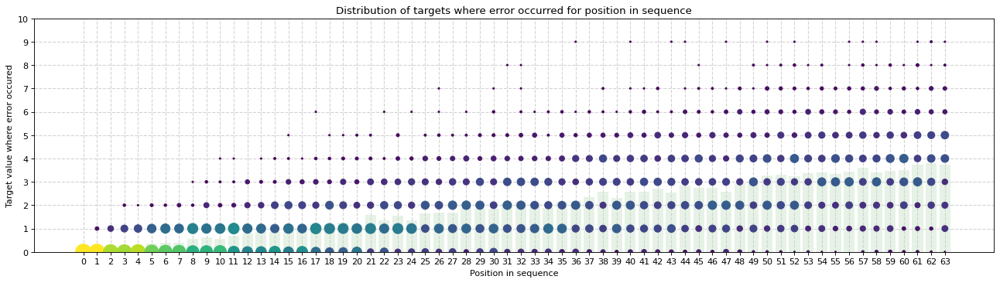

step 0 out of 5000
loss train 2.964416742324829
accuracy test 0.102294921875

step 50 out of 5000
loss train 1.5263820886611938
accuracy test 0.3572998046875

step 100 out of 5000
loss train 1.4092015027999878
accuracy test 0.3997802734375

step 150 out of 5000
loss train 1.0815916061401367
accuracy test 0.4945068359375

step 200 out of 5000
loss train 0.8925135731697083
accuracy test 0.6163330078125

step 250 out of 5000
loss train 0.7837352752685547
accuracy test 0.678466796875

step 300 out of 5000
loss train 0.6720208525657654
accuracy test 0.7200927734375

step 350 out of 5000
loss train 0.5584461092948914
accuracy test 0.756591796875

step 400 out of 5000
loss train 0.510886013507843
accuracy test 0.78759765625

step 450 out of 5000
loss train 0.434787392616272
accuracy test 0.8248291015625



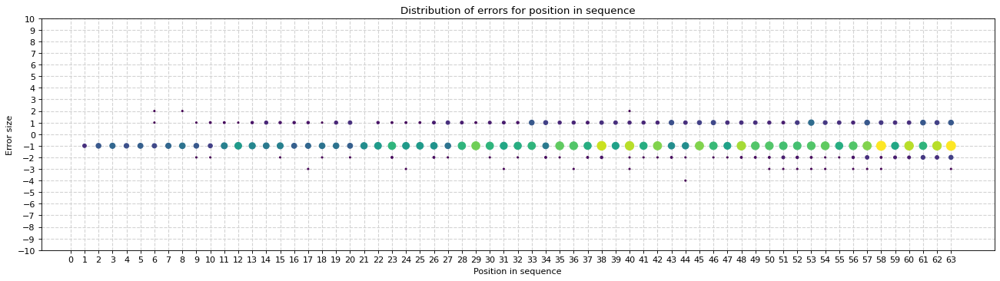

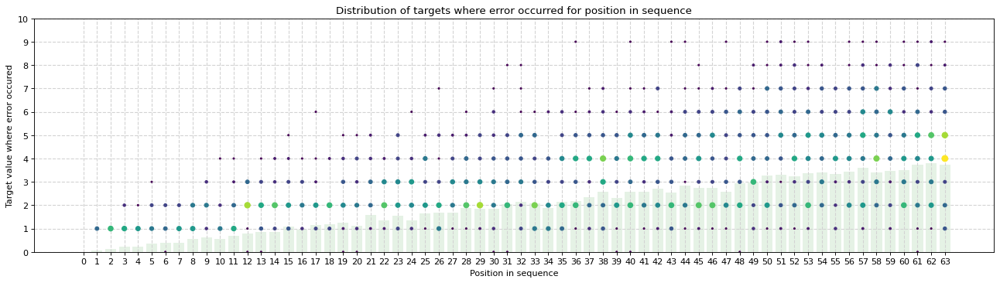

step 500 out of 5000
loss train 0.46097052097320557
accuracy test 0.7818603515625

step 550 out of 5000
loss train 0.38460981845855713
accuracy test 0.8565673828125

step 600 out of 5000
loss train 0.47018587589263916
accuracy test 0.85986328125

step 650 out of 5000
loss train 0.2895505130290985
accuracy test 0.8680419921875

step 700 out of 5000
loss train 0.3100692927837372
accuracy test 0.8829345703125

step 750 out of 5000
loss train 0.2359558790922165
accuracy test 0.8985595703125

step 800 out of 5000
loss train 0.24768076837062836
accuracy test 0.91357421875

step 850 out of 5000
loss train 0.19292719662189484
accuracy test 0.9068603515625

step 900 out of 5000
loss train 0.1942073255777359
accuracy test 0.910400390625

step 950 out of 5000
loss train 0.18833382427692413
accuracy test 0.9312744140625



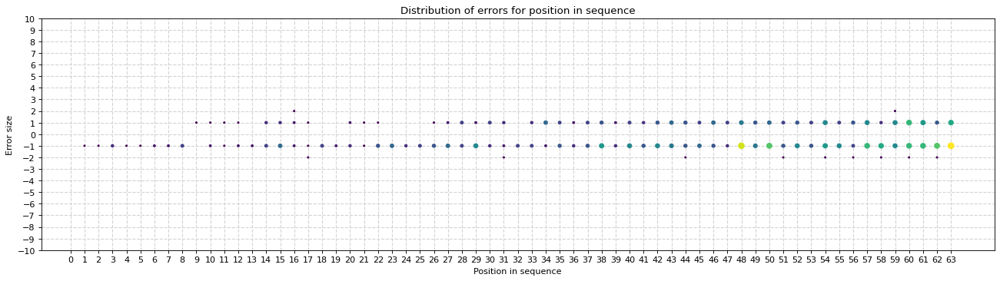

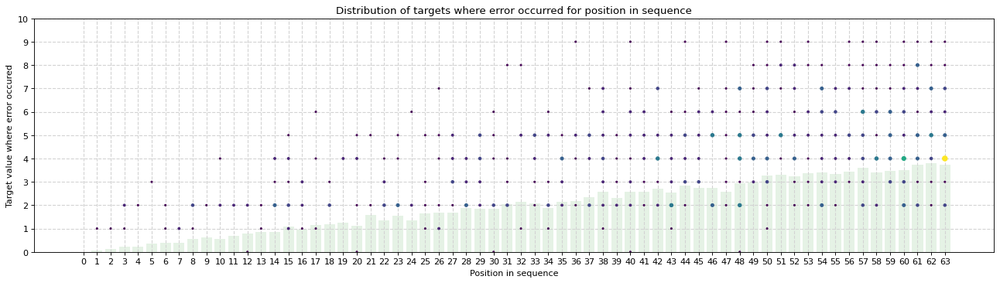

step 1000 out of 5000
loss train 0.16755981743335724
accuracy test 0.934814453125

step 1050 out of 5000
loss train 0.1705782115459442
accuracy test 0.91943359375

step 1100 out of 5000
loss train 0.13426712155342102
accuracy test 0.940185546875

step 1150 out of 5000
loss train 0.8291529417037964
accuracy test 0.6427001953125

step 1200 out of 5000
loss train 0.321046382188797
accuracy test 0.8651123046875

step 1250 out of 5000
loss train 0.2297571301460266
accuracy test 0.902099609375

step 1300 out of 5000
loss train 0.20509327948093414
accuracy test 0.9219970703125

step 1350 out of 5000
loss train 0.16095805168151855
accuracy test 0.936279296875

step 1400 out of 5000
loss train 0.16295504570007324
accuracy test 0.9342041015625

step 1450 out of 5000
loss train 0.12541833519935608
accuracy test 0.951171875



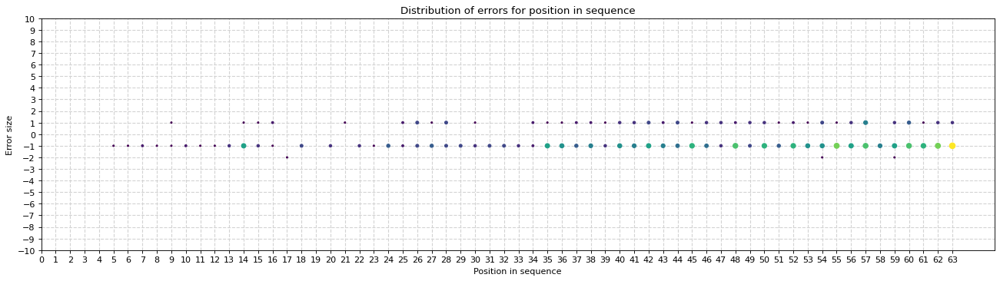

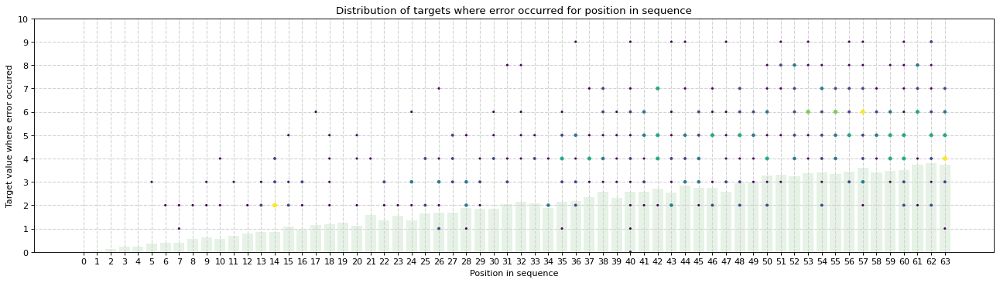

step 1500 out of 5000
loss train 0.11214717477560043
accuracy test 0.94970703125

step 1550 out of 5000
loss train 0.11907345801591873
accuracy test 0.9464111328125

step 1600 out of 5000
loss train 0.13454408943653107
accuracy test 0.95361328125

step 1650 out of 5000
loss train 0.09123029559850693
accuracy test 0.9677734375

step 1700 out of 5000
loss train 0.1201367974281311
accuracy test 0.966796875

step 1750 out of 5000
loss train 0.08523254841566086
accuracy test 0.9716796875

step 1800 out of 5000
loss train 0.11497695744037628
accuracy test 0.96728515625

step 1850 out of 5000
loss train 0.07350415736436844
accuracy test 0.9677734375

step 1900 out of 5000
loss train 0.07692419737577438
accuracy test 0.9671630859375

step 1950 out of 5000
loss train 0.07446997612714767
accuracy test 0.976806640625



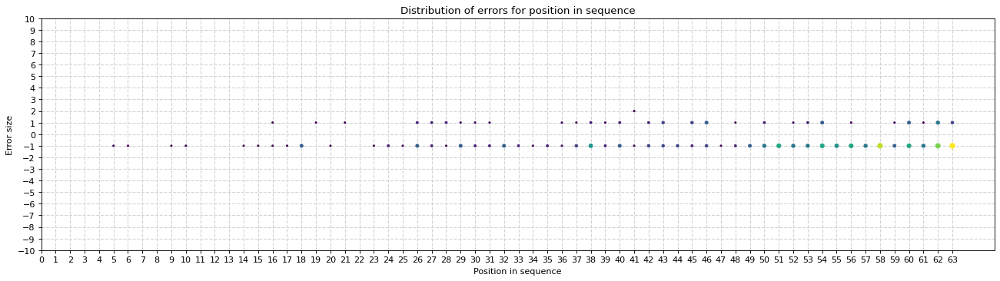

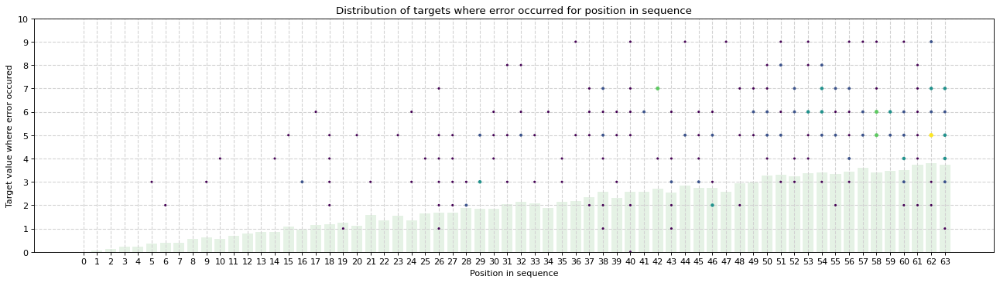

step 2000 out of 5000
loss train 0.0638875886797905
accuracy test 0.9720458984375

step 2050 out of 5000
loss train 0.12945449352264404
accuracy test 0.9696044921875

step 2100 out of 5000
loss train 0.09468823671340942
accuracy test 0.9732666015625

step 2150 out of 5000
loss train 0.08308669924736023
accuracy test 0.9765625

step 2200 out of 5000
loss train 0.07427475601434708
accuracy test 0.9783935546875

step 2250 out of 5000
loss train 0.07216201722621918
accuracy test 0.98046875

step 2300 out of 5000
loss train 0.07692527770996094
accuracy test 0.976806640625

step 2350 out of 5000
loss train 0.048278700560331345
accuracy test 0.9825439453125

step 2400 out of 5000
loss train 0.07478735595941544
accuracy test 0.9698486328125

step 2450 out of 5000
loss train 0.050342220813035965
accuracy test 0.975830078125



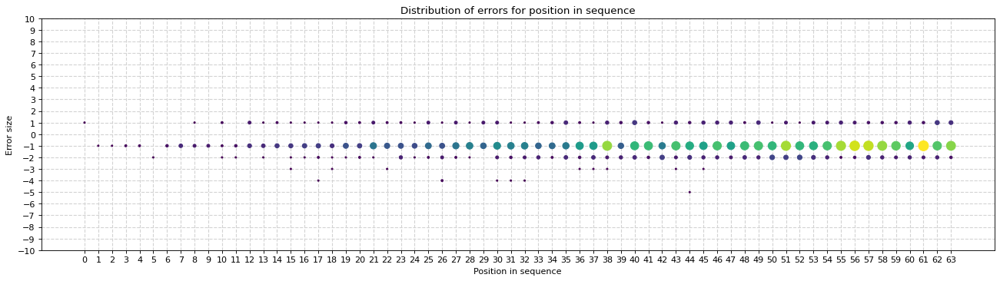

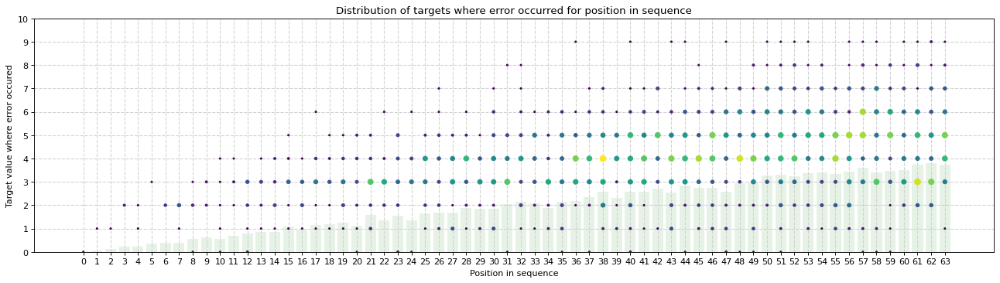

step 2500 out of 5000
loss train 0.49715885519981384
accuracy test 0.802001953125

step 2550 out of 5000
loss train 0.11735915392637253
accuracy test 0.970458984375

step 2600 out of 5000
loss train 0.0678546279668808
accuracy test 0.9798583984375

step 2650 out of 5000
loss train 0.0708518773317337
accuracy test 0.9803466796875

step 2700 out of 5000
loss train 0.07322036474943161
accuracy test 0.9769287109375

step 2750 out of 5000
loss train 0.055424947291612625
accuracy test 0.9827880859375

step 2800 out of 5000
loss train 0.054351236671209335
accuracy test 0.9847412109375

step 2850 out of 5000
loss train 0.049773652106523514
accuracy test 0.9840087890625

step 2900 out of 5000
loss train 0.03333641588687897
accuracy test 0.9859619140625

step 2950 out of 5000
loss train 0.04116036742925644
accuracy test 0.9825439453125



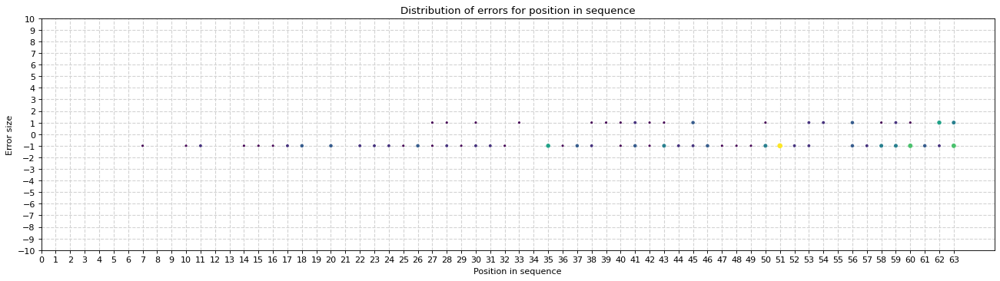

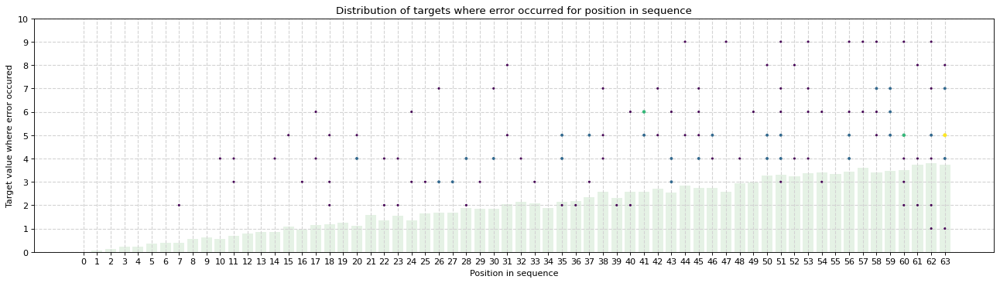

step 3000 out of 5000
loss train 0.03833967447280884
accuracy test 0.9822998046875

step 3050 out of 5000
loss train 0.04843186214566231
accuracy test 0.986328125

step 3100 out of 5000
loss train 0.07900962978601456
accuracy test 0.9703369140625

step 3150 out of 5000
loss train 0.059220559895038605
accuracy test 0.9854736328125

step 3200 out of 5000
loss train 0.03231688216328621
accuracy test 0.9888916015625

step 3250 out of 5000
loss train 0.0380169078707695
accuracy test 0.9901123046875

step 3300 out of 5000
loss train 0.0277134757488966
accuracy test 0.99072265625

step 3350 out of 5000
loss train 0.05229387804865837
accuracy test 0.980712890625

step 3400 out of 5000
loss train 0.034526366740465164
accuracy test 0.9813232421875

step 3450 out of 5000
loss train 0.029126519337296486
accuracy test 0.9913330078125



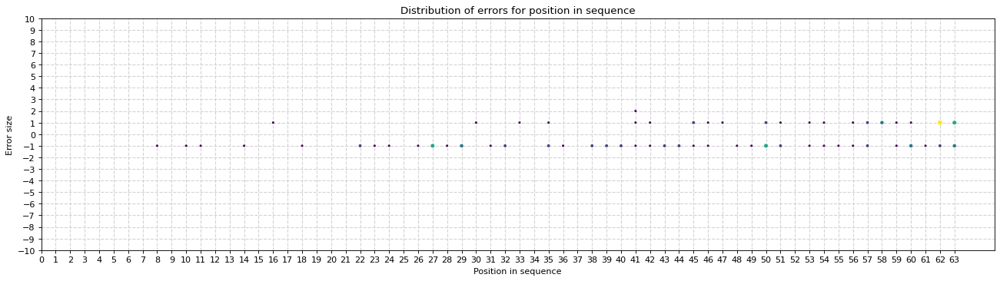

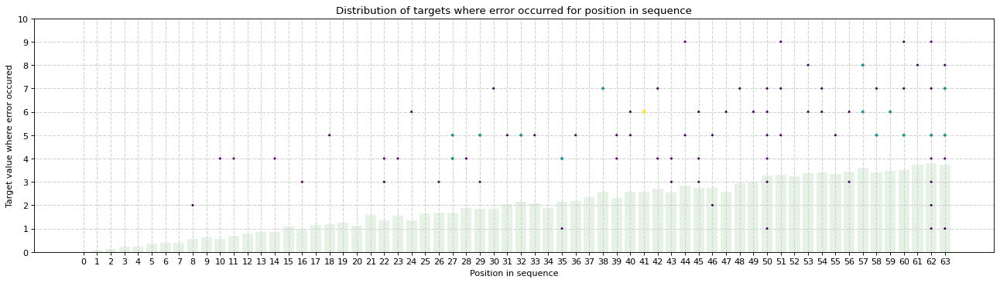

step 3500 out of 5000
loss train 0.03854050859808922
accuracy test 0.98828125

step 3550 out of 5000
loss train 0.028119780123233795
accuracy test 0.9898681640625

step 3600 out of 5000
loss train 0.11071882396936417
accuracy test 0.9361572265625

step 3650 out of 5000
loss train 0.035416316241025925
accuracy test 0.9884033203125

step 3700 out of 5000
loss train 0.023765023797750473
accuracy test 0.9915771484375

step 3750 out of 5000
loss train 0.01909099891781807
accuracy test 0.9910888671875

step 3800 out of 5000
loss train 0.018822437152266502
accuracy test 0.992431640625

step 3850 out of 5000
loss train 0.02747921831905842
accuracy test 0.9876708984375

step 3900 out of 5000
loss train 0.182694673538208
accuracy test 0.8958740234375

step 3950 out of 5000
loss train 0.04317411035299301
accuracy test 0.988037109375



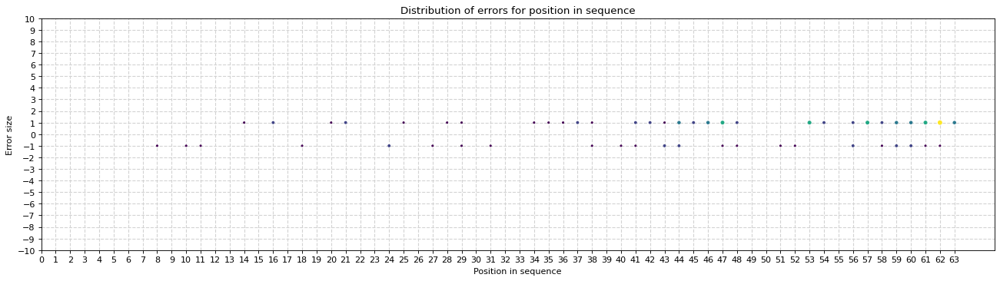

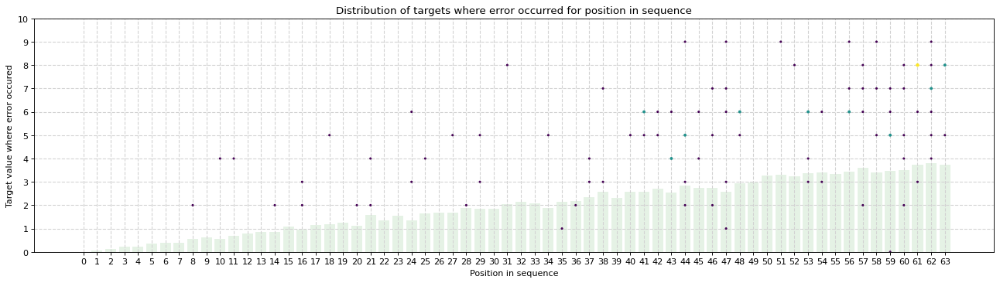

step 4000 out of 5000
loss train 0.03516305983066559
accuracy test 0.98828125

step 4050 out of 5000
loss train 0.024180857464671135
accuracy test 0.988037109375

step 4100 out of 5000
loss train 0.06525502353906631
accuracy test 0.9915771484375

step 4150 out of 5000
loss train 0.02395639382302761
accuracy test 0.992431640625

step 4200 out of 5000
loss train 0.2229461967945099
accuracy test 0.7166748046875

step 4250 out of 5000
loss train 0.04574115574359894
accuracy test 0.981689453125

step 4300 out of 5000
loss train 0.03816238418221474
accuracy test 0.9920654296875

step 4350 out of 5000
loss train 0.021838240325450897
accuracy test 0.991455078125

step 4400 out of 5000
loss train 0.03490398824214935
accuracy test 0.9896240234375

step 4450 out of 5000
loss train 0.01851135864853859
accuracy test 0.9918212890625



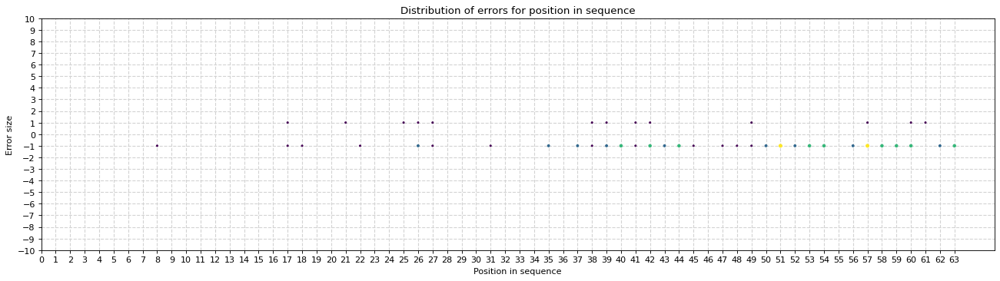

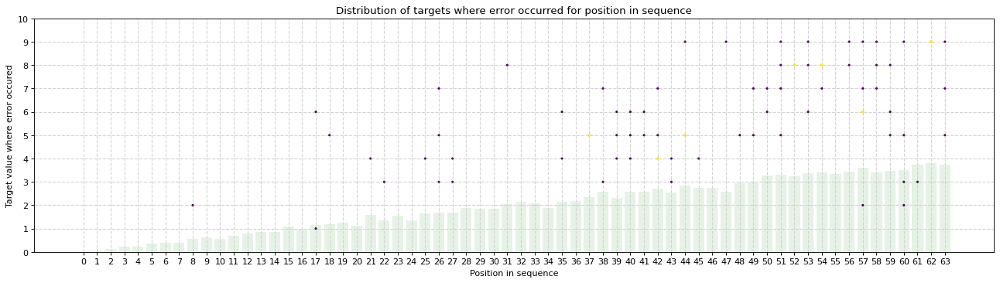

step 4500 out of 5000
loss train 0.028336331248283386
accuracy test 0.990478515625

step 4550 out of 5000
loss train 0.017228180542588234
accuracy test 0.9942626953125

step 4600 out of 5000
loss train 0.02688191831111908
accuracy test 0.9940185546875

step 4650 out of 5000
loss train 0.052175115793943405
accuracy test 0.986083984375

step 4700 out of 5000
loss train 0.013505657203495502
accuracy test 0.9932861328125

step 4750 out of 5000
loss train 0.013740616850554943
accuracy test 0.9949951171875

step 4800 out of 5000
loss train 0.016543589532375336
accuracy test 0.9935302734375

step 4850 out of 5000
loss train 0.025178836658596992
accuracy test 0.9940185546875

step 4900 out of 5000
loss train 0.28411445021629333
accuracy test 0.9359130859375

step 4950 out of 5000
loss train 0.04315311461687088
accuracy test 0.980712890625



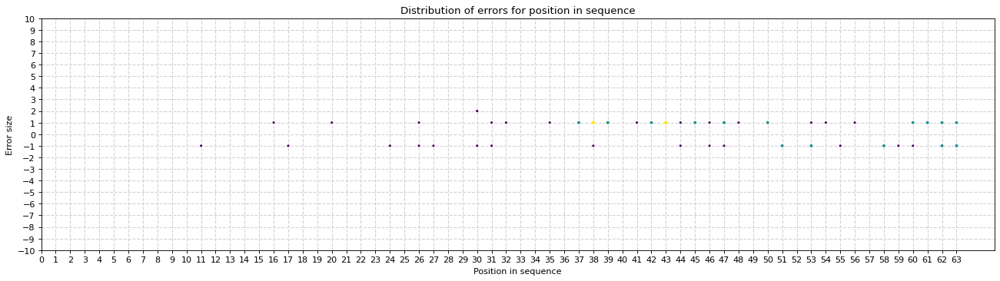

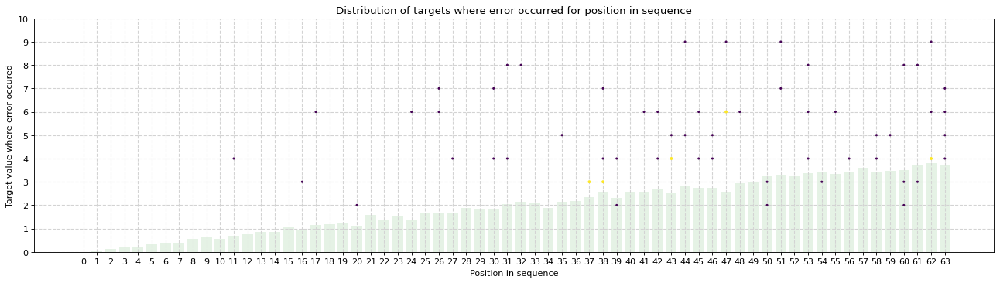

step 4999 out of 5000
loss train 0.03218685835599899
accuracy test 0.9921875


TRAINING TIME: 151.56436586380005


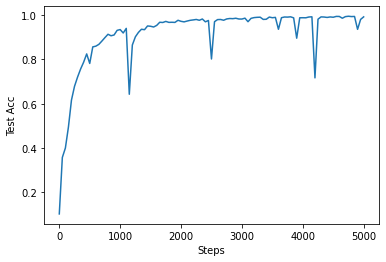

In [7]:
HIDDEN_DIM = 64
FF_DIM = 2048
N_HEADS = 4
N_LAYERS = 4

BATCH_SIZE = 32
LR = 0.0001
NUM_STEPS = 5000

model = EncoderModel(N_TOKENS, HIDDEN_DIM, FF_DIM, OUTPUT_DIM, N_LAYERS, N_HEADS)
accs = train_model(model, LR, NUM_STEPS, BATCH_SIZE, plot_errors=True)
plt.plot([i * NUM_STEPS/(len(accs)-1) for i in range(len(accs))], accs)
plt.xlabel('Steps')
plt.ylabel('Test Acc')
plt.show()


## Experiments

For all experiments I choose the same parameters as in the main model, only changing the number of steps.



In [8]:
def print_examples(trained_model):
  targets = test_Y.transpose(0, 1).cpu().tolist()
  inputs = test_X.transpose(0, 1).cpu().tolist()
  predictions = trained_model.forward(test_X).reshape(-1, OUTPUT_DIM)
  predictions = torch.argmax(predictions, dim=-1).view(-1, TEST_SIZE)
  predictions = predictions.transpose(0, 1).cpu().tolist()
  for i in range(5):
    r = random.randint(0, len(inputs))
    print(100 * '#' + f' EXAMPLE {i + 1} ' + 100 * '#')
    print('Sequence:')
    print(inputs[r])
    print('Prediction:')
    print(predictions[r])
    print('Target:')
    print(targets[r], '\n')

### Model without encoding layer

*For this experiment, I decreased the number of steps to 1000 since for greater values there is no improvement to loss, nor accuracy.*

My interpretation of the error plots is that the model only tries to learn the mean value of all targets since it doesn't have any information about the position of the token in the sequence. The decrease in the loss function's value is minor, which shows that model isn't learning much.


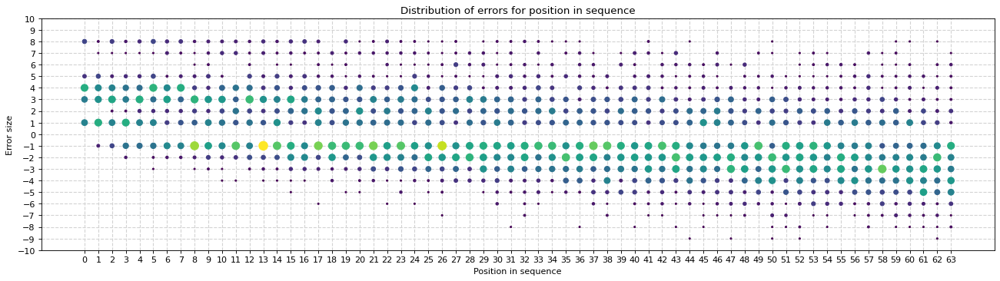

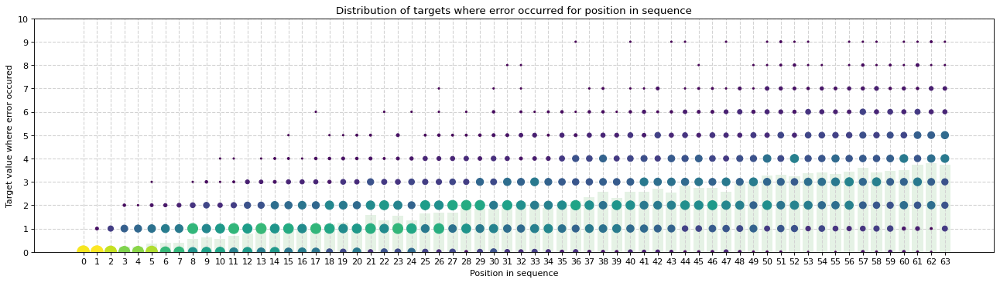

step 0 out of 1000
loss train 2.4760677814483643
accuracy test 0.1783447265625

step 10 out of 1000
loss train 1.9189144372940063
accuracy test 0.236572265625

step 20 out of 1000
loss train 1.8402718305587769
accuracy test 0.23681640625

step 30 out of 1000
loss train 1.8411407470703125
accuracy test 0.242919921875

step 40 out of 1000
loss train 1.841786503791809
accuracy test 0.2437744140625

step 50 out of 1000
loss train 1.8396276235580444
accuracy test 0.24560546875

step 60 out of 1000
loss train 1.8579182624816895
accuracy test 0.24560546875

step 70 out of 1000
loss train 1.8045573234558105
accuracy test 0.2454833984375

step 80 out of 1000
loss train 1.8268171548843384
accuracy test 0.2442626953125

step 90 out of 1000
loss train 1.8155107498168945
accuracy test 0.24560546875



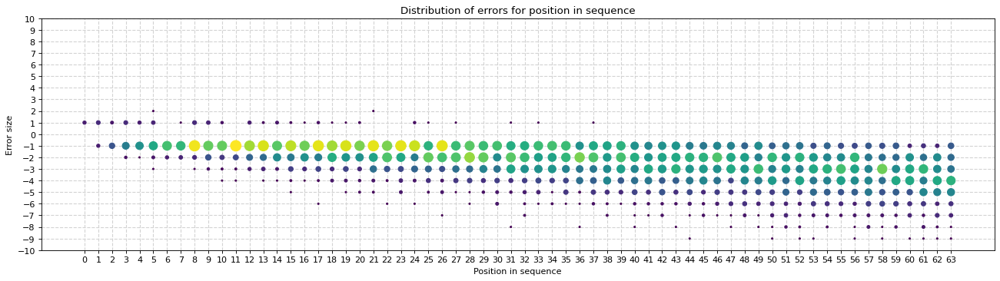

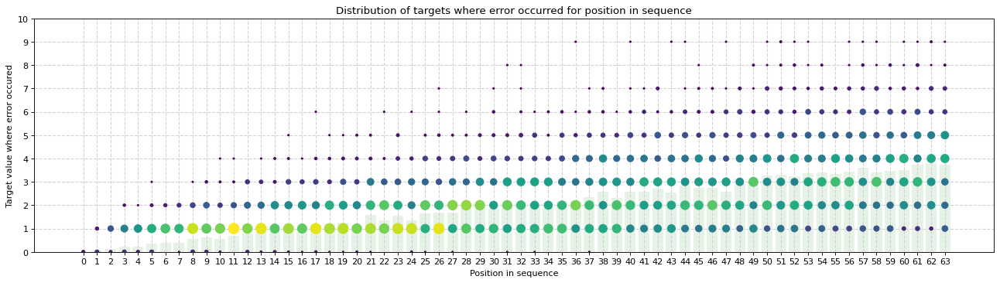

step 100 out of 1000
loss train 1.798159122467041
accuracy test 0.24560546875

step 110 out of 1000
loss train 1.7915568351745605
accuracy test 0.244873046875

step 120 out of 1000
loss train 1.7750741243362427
accuracy test 0.2449951171875

step 130 out of 1000
loss train 1.7654857635498047
accuracy test 0.245361328125

step 140 out of 1000
loss train 1.7766289710998535
accuracy test 0.24560546875

step 150 out of 1000
loss train 1.6913504600524902
accuracy test 0.24560546875

step 160 out of 1000
loss train 1.677587628364563
accuracy test 0.24560546875

step 170 out of 1000
loss train 1.6856659650802612
accuracy test 0.24560546875

step 180 out of 1000
loss train 1.658441424369812
accuracy test 0.24560546875

step 190 out of 1000
loss train 1.640518307685852
accuracy test 0.24560546875



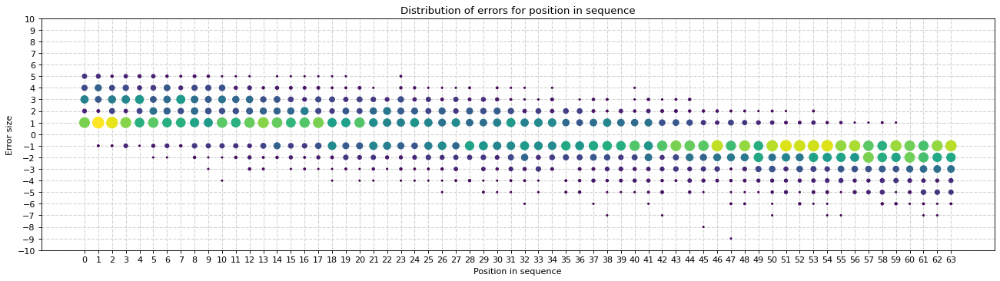

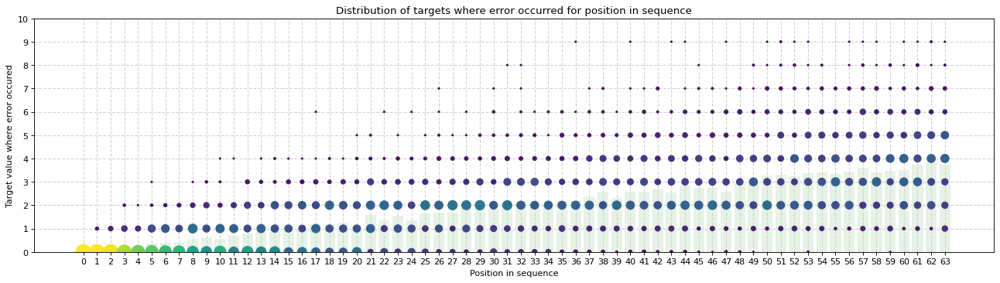

step 200 out of 1000
loss train 1.6542582511901855
accuracy test 0.24560546875

step 210 out of 1000
loss train 1.6064921617507935
accuracy test 0.245361328125

step 220 out of 1000
loss train 1.6099319458007812
accuracy test 0.24560546875

step 230 out of 1000
loss train 1.6124151945114136
accuracy test 0.24560546875

step 240 out of 1000
loss train 1.5936312675476074
accuracy test 0.24560546875

step 250 out of 1000
loss train 1.5990831851959229
accuracy test 0.24560546875

step 260 out of 1000
loss train 1.5826181173324585
accuracy test 0.24560546875

step 270 out of 1000
loss train 1.567968726158142
accuracy test 0.24560546875

step 280 out of 1000
loss train 1.5655571222305298
accuracy test 0.24560546875

step 290 out of 1000
loss train 1.5638378858566284
accuracy test 0.24560546875



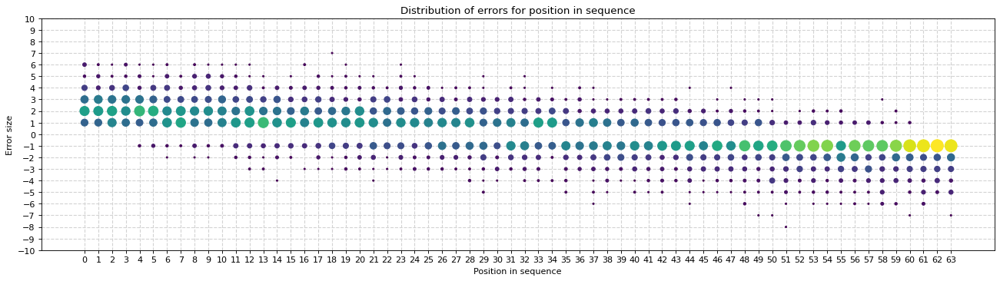

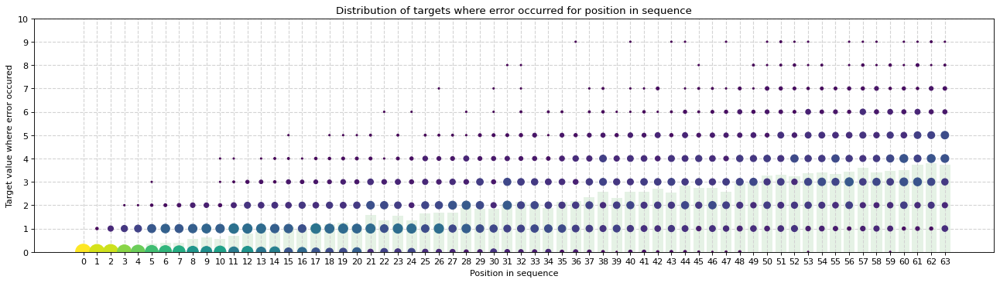

step 300 out of 1000
loss train 1.5796117782592773
accuracy test 0.24560546875

step 310 out of 1000
loss train 1.6094762086868286
accuracy test 0.24560546875

step 320 out of 1000
loss train 1.5845577716827393
accuracy test 0.24560546875

step 330 out of 1000
loss train 1.5648291110992432
accuracy test 0.24560546875

step 340 out of 1000
loss train 1.56296968460083
accuracy test 0.24560546875

step 350 out of 1000
loss train 1.5597835779190063
accuracy test 0.24560546875

step 360 out of 1000
loss train 1.5380641222000122
accuracy test 0.24560546875

step 370 out of 1000
loss train 1.5739189386367798
accuracy test 0.24560546875

step 380 out of 1000
loss train 1.5644662380218506
accuracy test 0.24560546875

step 390 out of 1000
loss train 1.5656766891479492
accuracy test 0.24560546875



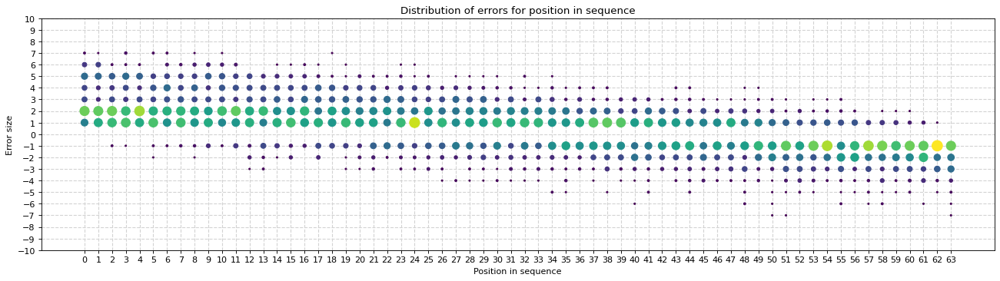

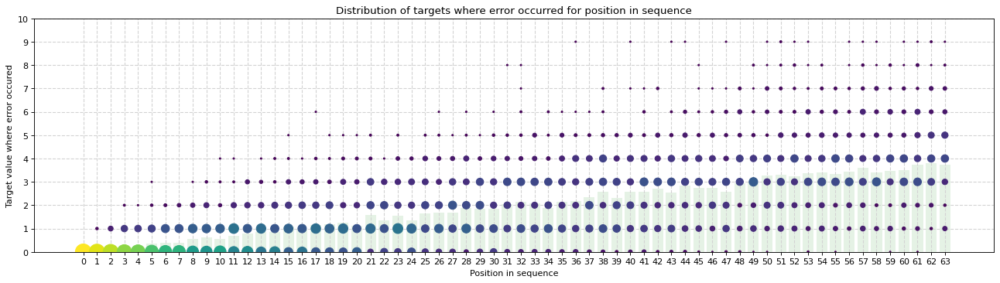

step 400 out of 1000
loss train 1.5507665872573853
accuracy test 0.24560546875

step 410 out of 1000
loss train 1.5409138202667236
accuracy test 0.24560546875

step 420 out of 1000
loss train 1.5323400497436523
accuracy test 0.24560546875

step 430 out of 1000
loss train 1.5377161502838135
accuracy test 0.24560546875

step 440 out of 1000
loss train 1.5373586416244507
accuracy test 0.24560546875

step 450 out of 1000
loss train 1.515813946723938
accuracy test 0.24560546875

step 460 out of 1000
loss train 1.5347089767456055
accuracy test 0.24560546875

step 470 out of 1000
loss train 1.534147024154663
accuracy test 0.24560546875

step 480 out of 1000
loss train 1.5319952964782715
accuracy test 0.24560546875

step 490 out of 1000
loss train 1.5401365756988525
accuracy test 0.2447509765625



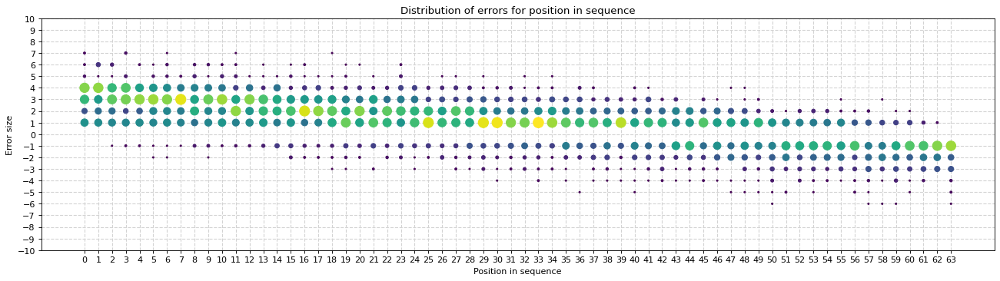

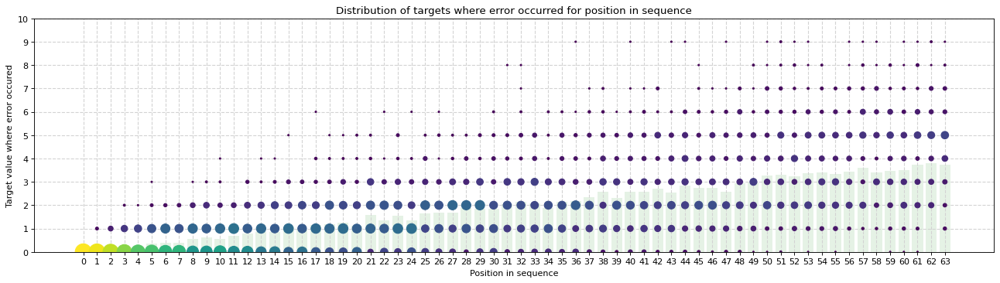

step 500 out of 1000
loss train 1.5390551090240479
accuracy test 0.2452392578125

step 510 out of 1000
loss train 1.5653893947601318
accuracy test 0.24560546875

step 520 out of 1000
loss train 1.5346143245697021
accuracy test 0.24560546875

step 530 out of 1000
loss train 1.5443130731582642
accuracy test 0.24560546875

step 540 out of 1000
loss train 1.5400936603546143
accuracy test 0.24560546875

step 550 out of 1000
loss train 1.5197577476501465
accuracy test 0.24560546875

step 560 out of 1000
loss train 1.516829252243042
accuracy test 0.24560546875

step 570 out of 1000
loss train 1.534976601600647
accuracy test 0.24560546875

step 580 out of 1000
loss train 1.516660451889038
accuracy test 0.24560546875

step 590 out of 1000
loss train 1.5110464096069336
accuracy test 0.24560546875



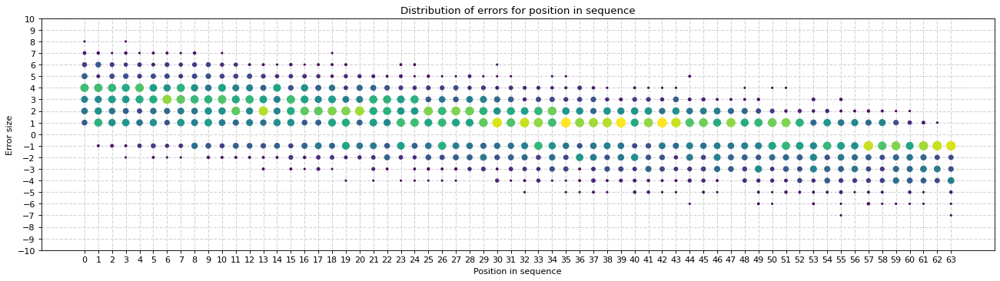

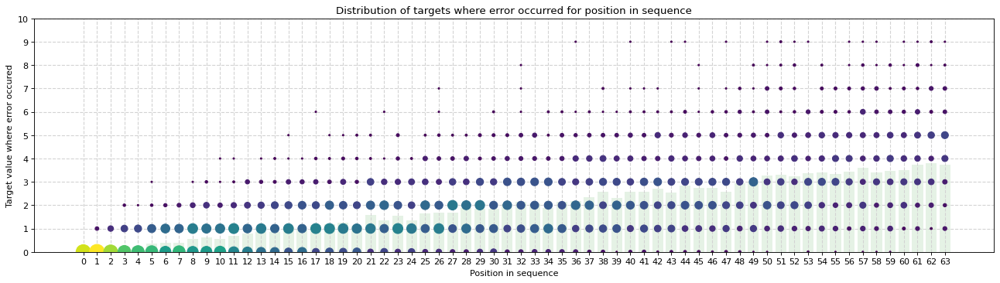

step 600 out of 1000
loss train 1.5362993478775024
accuracy test 0.24560546875

step 610 out of 1000
loss train 1.5274701118469238
accuracy test 0.24560546875

step 620 out of 1000
loss train 1.514068365097046
accuracy test 0.245849609375

step 630 out of 1000
loss train 1.5412887334823608
accuracy test 0.24560546875

step 640 out of 1000
loss train 1.52437424659729
accuracy test 0.24560546875

step 650 out of 1000
loss train 1.5256062746047974
accuracy test 0.245849609375

step 660 out of 1000
loss train 1.5274779796600342
accuracy test 0.24560546875

step 670 out of 1000
loss train 1.5328497886657715
accuracy test 0.24560546875

step 680 out of 1000
loss train 1.5174177885055542
accuracy test 0.245849609375

step 690 out of 1000
loss train 1.5245691537857056
accuracy test 0.245849609375



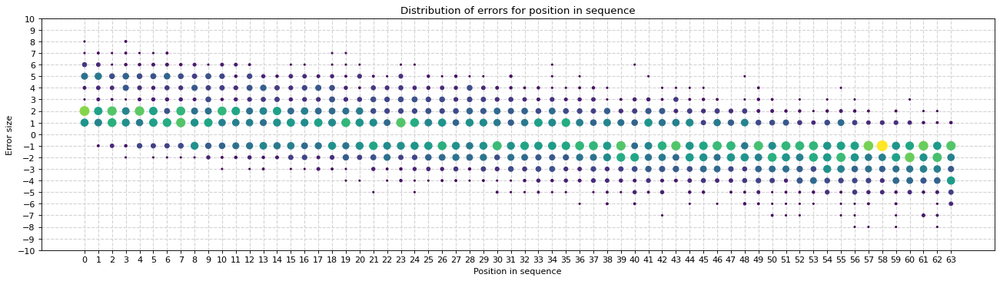

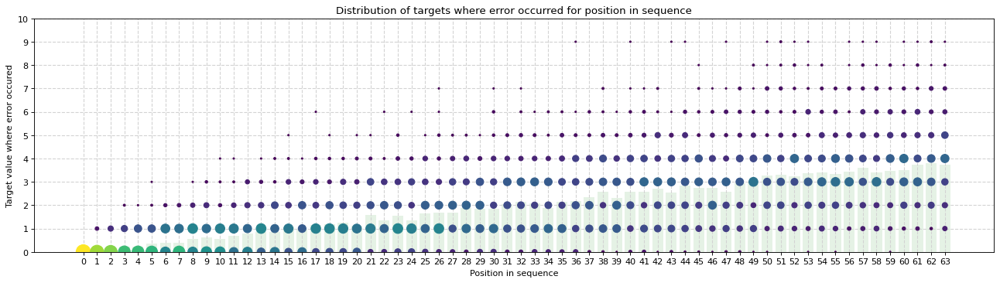

step 700 out of 1000
loss train 1.5319476127624512
accuracy test 0.240966796875

step 710 out of 1000
loss train 1.5296294689178467
accuracy test 0.24560546875

step 720 out of 1000
loss train 1.531544804573059
accuracy test 0.2462158203125

step 730 out of 1000
loss train 1.577359676361084
accuracy test 0.24560546875

step 740 out of 1000
loss train 1.5632448196411133
accuracy test 0.24560546875

step 750 out of 1000
loss train 1.5400159358978271
accuracy test 0.2452392578125

step 760 out of 1000
loss train 1.5491963624954224
accuracy test 0.245361328125

step 770 out of 1000
loss train 1.562241792678833
accuracy test 0.2452392578125

step 780 out of 1000
loss train 1.5354138612747192
accuracy test 0.24560546875

step 790 out of 1000
loss train 1.5349926948547363
accuracy test 0.24560546875



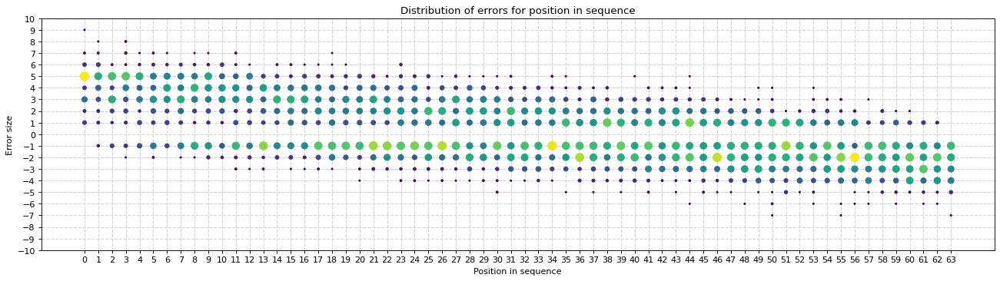

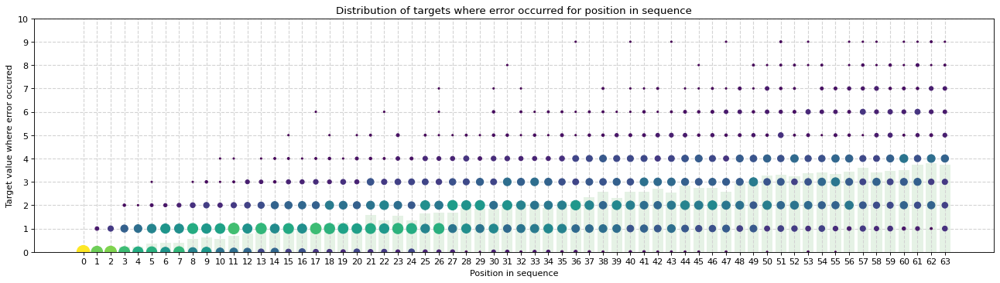

step 800 out of 1000
loss train 1.5257952213287354
accuracy test 0.245849609375

step 810 out of 1000
loss train 1.5441735982894897
accuracy test 0.245849609375

step 820 out of 1000
loss train 1.5222373008728027
accuracy test 0.245849609375

step 830 out of 1000
loss train 1.5294482707977295
accuracy test 0.245849609375

step 840 out of 1000
loss train 1.5263227224349976
accuracy test 0.245849609375

step 850 out of 1000
loss train 1.5283209085464478
accuracy test 0.245849609375

step 860 out of 1000
loss train 1.5349981784820557
accuracy test 0.245849609375

step 870 out of 1000
loss train 1.5133304595947266
accuracy test 0.245849609375

step 880 out of 1000
loss train 1.5221364498138428
accuracy test 0.245849609375

step 890 out of 1000
loss train 1.5177258253097534
accuracy test 0.245849609375



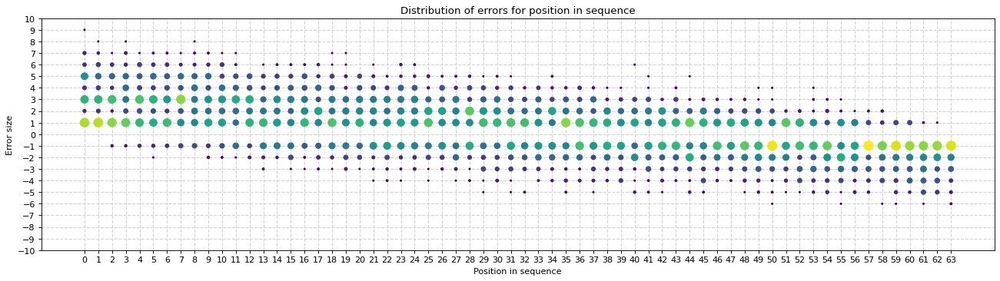

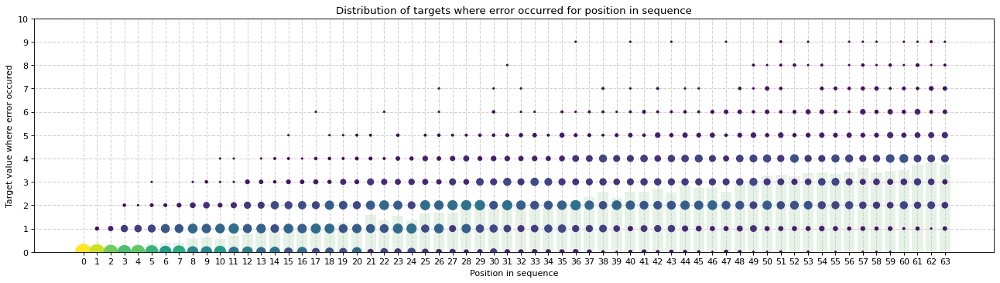

step 900 out of 1000
loss train 1.5235460996627808
accuracy test 0.245849609375

step 910 out of 1000
loss train 1.5281915664672852
accuracy test 0.245849609375

step 920 out of 1000
loss train 1.5316836833953857
accuracy test 0.245849609375

step 930 out of 1000
loss train 1.5273891687393188
accuracy test 0.245849609375

step 940 out of 1000
loss train 1.5275849103927612
accuracy test 0.245849609375

step 950 out of 1000
loss train 1.5139596462249756
accuracy test 0.245849609375

step 960 out of 1000
loss train 1.5182186365127563
accuracy test 0.2462158203125

step 970 out of 1000
loss train 1.5280033349990845
accuracy test 0.245849609375

step 980 out of 1000
loss train 1.5260053873062134
accuracy test 0.245849609375

step 990 out of 1000
loss train 1.526496410369873
accuracy test 0.245849609375



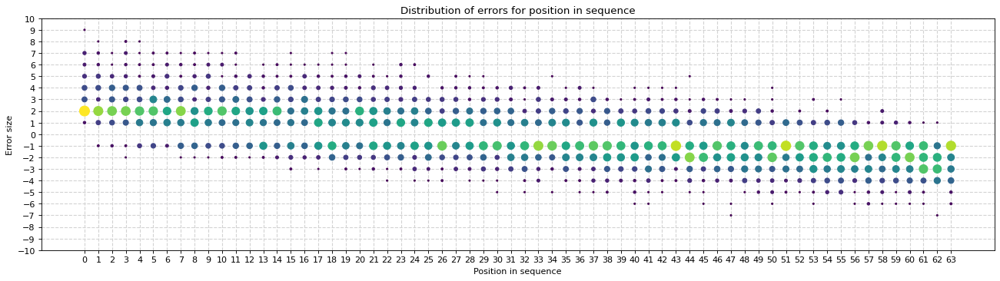

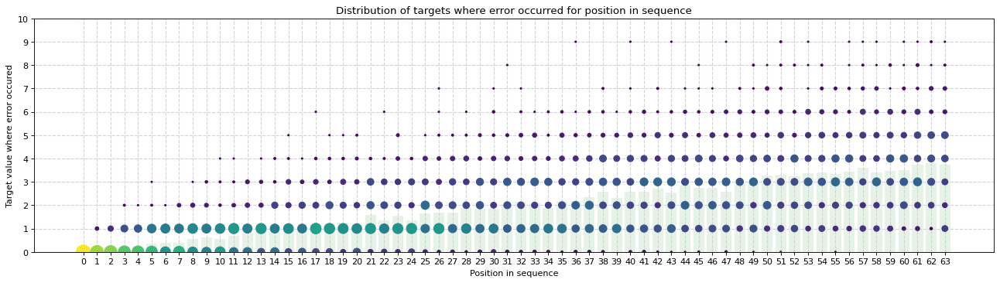

step 999 out of 1000
loss train 1.5173739194869995
accuracy test 0.245849609375


TRAINING TIME: 47.9102463722229


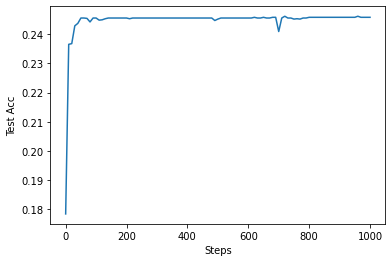

#################################################################################################### EXAMPLE 1 ####################################################################################################
Sequence:
[13, 5, 13, 11, 4, 13, 9, 5, 14, 8, 0, 7, 12, 5, 8, 4, 7, 3, 5, 3, 2, 7, 12, 1, 13, 6, 15, 2, 7, 5, 13, 10, 1, 6, 12, 5, 0, 11, 12, 0, 2, 1, 12, 10, 6, 7, 10, 10, 0, 9, 10, 5, 4, 9, 15, 5, 10, 14, 4, 3, 14, 1, 14, 12]
Prediction:
[2, 2, 2, 0, 1, 2, 0, 2, 0, 0, 0, 2, 5, 2, 0, 1, 2, 0, 2, 0, 2, 2, 5, 0, 2, 0, 0, 2, 2, 2, 2, 2, 0, 0, 5, 2, 0, 0, 5, 0, 2, 0, 5, 2, 0, 2, 2, 2, 0, 0, 2, 2, 1, 0, 0, 2, 2, 0, 1, 0, 0, 0, 0, 5]
Target:
[0, 0, 1, 0, 0, 2, 0, 1, 0, 0, 0, 0, 0, 2, 1, 1, 1, 0, 3, 1, 0, 2, 1, 0, 3, 0, 0, 1, 3, 4, 4, 0, 1, 1, 2, 5, 1, 1, 3, 2, 2, 2, 4, 1, 2, 4, 2, 3, 3, 1, 4, 6, 2, 2, 1, 7, 5, 1, 3, 2, 2, 3, 3, 5] 

#################################################################################################### EXAMPLE 2 #########################################

In [9]:
HIDDEN_DIM = 64
FF_DIM = 2048
N_HEADS = 4
N_LAYERS = 4

BATCH_SIZE = 32
LR = 0.0001
NUM_STEPS = 1000

model_wo_positional = EncoderModel(N_TOKENS, HIDDEN_DIM, FF_DIM, OUTPUT_DIM, N_LAYERS, N_HEADS, use_positional=False)
accs = train_model(model_wo_positional, LR, NUM_STEPS, BATCH_SIZE, plot_errors=True)
plt.plot([i * NUM_STEPS/(len(accs)-1) for i in range(len(accs))], accs)
plt.xlabel('Steps')
plt.ylabel('Test Acc')
plt.show()

print_examples(model_wo_positional)

### Model without Feed-Forward layer.

In this experiment, the model performs very similarly to the one with a feed-forward layer, except that it struggles to get better accuracy than 97% and the learning process is slower.


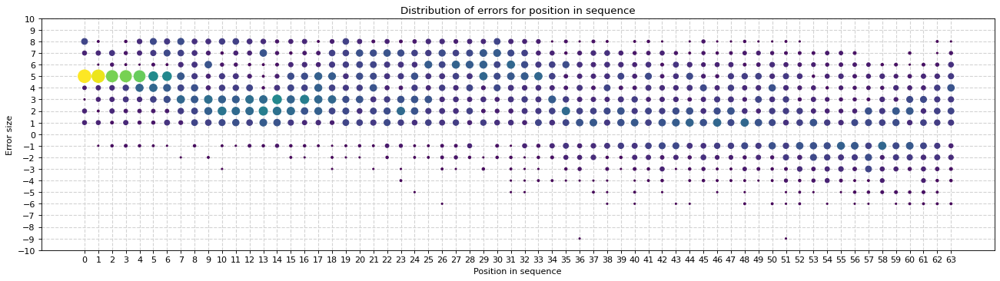

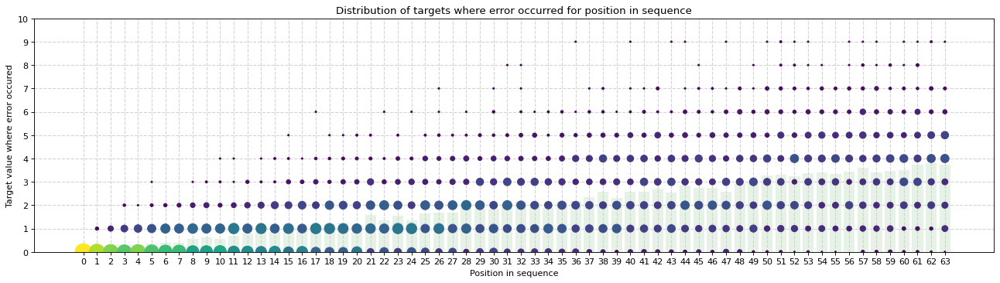

step 0 out of 5000
loss train 2.5776660442352295
accuracy test 0.096923828125

step 50 out of 5000
loss train 1.5942269563674927
accuracy test 0.353759765625

step 100 out of 5000
loss train 1.507779836654663
accuracy test 0.361328125

step 150 out of 5000
loss train 1.5093748569488525
accuracy test 0.3818359375

step 200 out of 5000
loss train 1.248611330986023
accuracy test 0.476318359375

step 250 out of 5000
loss train 1.0970977544784546
accuracy test 0.560546875

step 300 out of 5000
loss train 0.8800246715545654
accuracy test 0.6181640625

step 350 out of 5000
loss train 0.7813257575035095
accuracy test 0.669189453125

step 400 out of 5000
loss train 0.7047762870788574
accuracy test 0.684326171875

step 450 out of 5000
loss train 0.6134340167045593
accuracy test 0.7066650390625



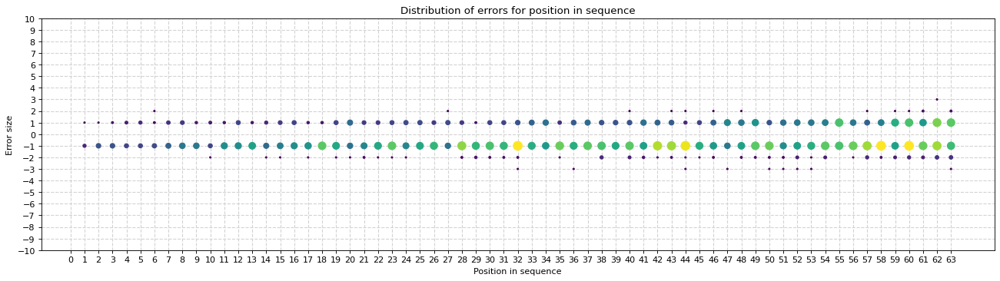

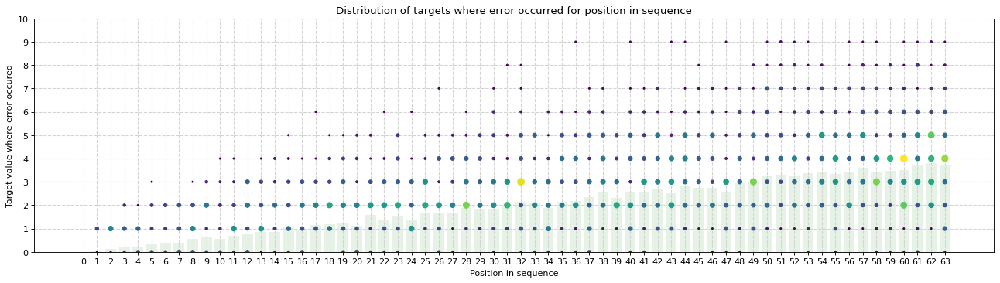

step 500 out of 5000
loss train 0.6147149205207825
accuracy test 0.7393798828125

step 550 out of 5000
loss train 0.5807349681854248
accuracy test 0.7542724609375

step 600 out of 5000
loss train 0.5269550681114197
accuracy test 0.7611083984375

step 650 out of 5000
loss train 0.5045134425163269
accuracy test 0.7806396484375

step 700 out of 5000
loss train 0.48350292444229126
accuracy test 0.793701171875

step 750 out of 5000
loss train 0.44719135761260986
accuracy test 0.810302734375

step 800 out of 5000
loss train 0.4640997648239136
accuracy test 0.8087158203125

step 850 out of 5000
loss train 0.38035067915916443
accuracy test 0.8173828125

step 900 out of 5000
loss train 0.40404966473579407
accuracy test 0.8258056640625

step 950 out of 5000
loss train 0.3774925470352173
accuracy test 0.8399658203125



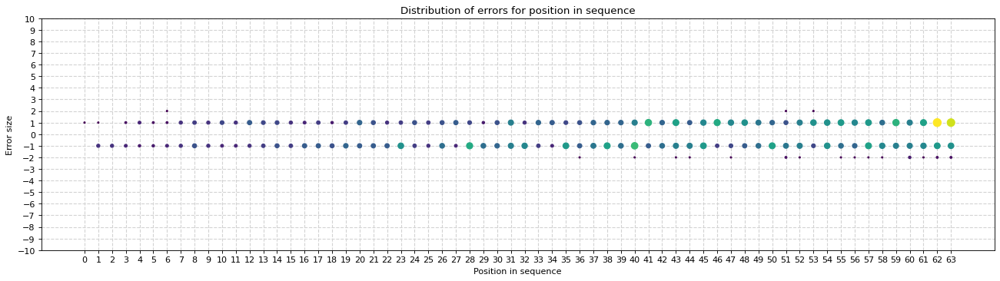

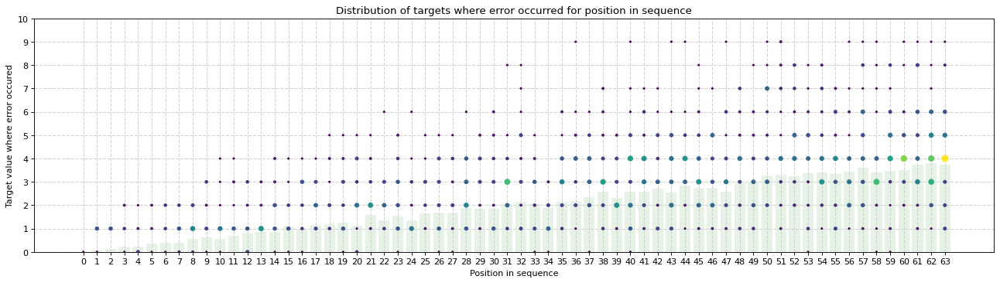

step 1000 out of 5000
loss train 0.4138560891151428
accuracy test 0.8466796875

step 1050 out of 5000
loss train 0.37653684616088867
accuracy test 0.8572998046875

step 1100 out of 5000
loss train 0.34614837169647217
accuracy test 0.8514404296875

step 1150 out of 5000
loss train 0.3326338827610016
accuracy test 0.86181640625

step 1200 out of 5000
loss train 0.34214919805526733
accuracy test 0.8621826171875

step 1250 out of 5000
loss train 0.3949514627456665
accuracy test 0.8514404296875

step 1300 out of 5000
loss train 0.3430807292461395
accuracy test 0.8779296875

step 1350 out of 5000
loss train 0.29100263118743896
accuracy test 0.87255859375

step 1400 out of 5000
loss train 0.2916763424873352
accuracy test 0.8834228515625

step 1450 out of 5000
loss train 0.26650020480155945
accuracy test 0.889892578125



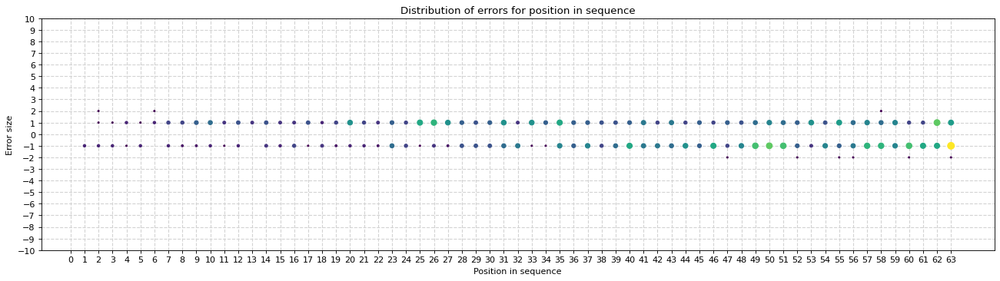

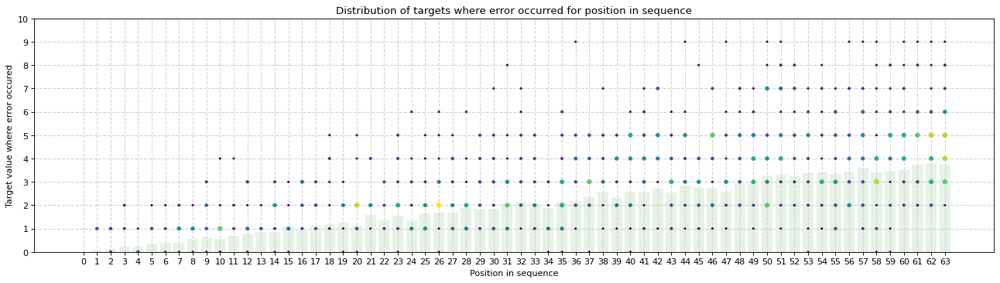

step 1500 out of 5000
loss train 0.2737196385860443
accuracy test 0.894775390625

step 1550 out of 5000
loss train 0.2574124038219452
accuracy test 0.894775390625

step 1600 out of 5000
loss train 0.25009554624557495
accuracy test 0.899169921875

step 1650 out of 5000
loss train 0.2508164346218109
accuracy test 0.90380859375

step 1700 out of 5000
loss train 0.24600306153297424
accuracy test 0.8956298828125

step 1750 out of 5000
loss train 0.23319995403289795
accuracy test 0.910888671875

step 1800 out of 5000
loss train 0.22166505455970764
accuracy test 0.9112548828125

step 1850 out of 5000
loss train 0.19624699652194977
accuracy test 0.9061279296875

step 1900 out of 5000
loss train 0.21428586542606354
accuracy test 0.904296875

step 1950 out of 5000
loss train 0.2080087959766388
accuracy test 0.9114990234375



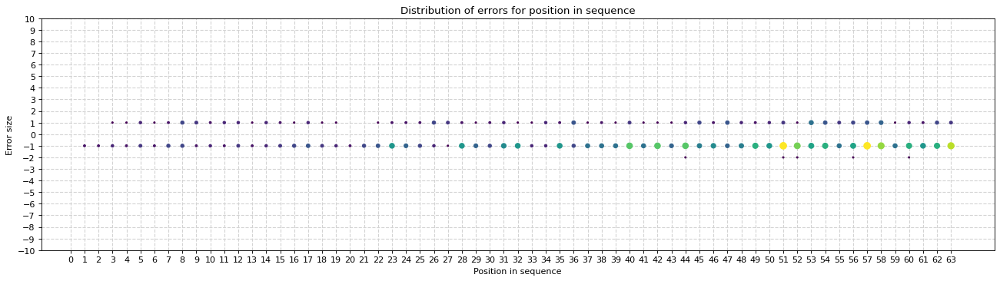

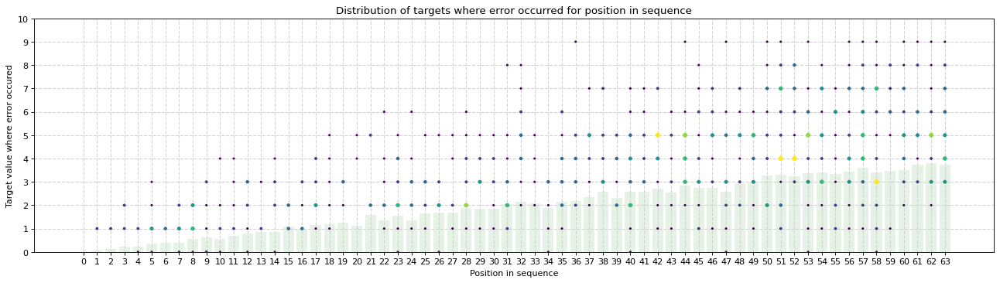

step 2000 out of 5000
loss train 0.2173735499382019
accuracy test 0.9190673828125

step 2050 out of 5000
loss train 0.17972451448440552
accuracy test 0.924560546875

step 2100 out of 5000
loss train 0.18736109137535095
accuracy test 0.9267578125

step 2150 out of 5000
loss train 0.18820643424987793
accuracy test 0.9217529296875

step 2200 out of 5000
loss train 0.17545408010482788
accuracy test 0.9271240234375

step 2250 out of 5000
loss train 0.1651061326265335
accuracy test 0.9166259765625

step 2300 out of 5000
loss train 0.1674831062555313
accuracy test 0.9307861328125

step 2350 out of 5000
loss train 0.18355342745780945
accuracy test 0.9345703125

step 2400 out of 5000
loss train 0.14385494589805603
accuracy test 0.9151611328125

step 2450 out of 5000
loss train 0.16473649442195892
accuracy test 0.9346923828125



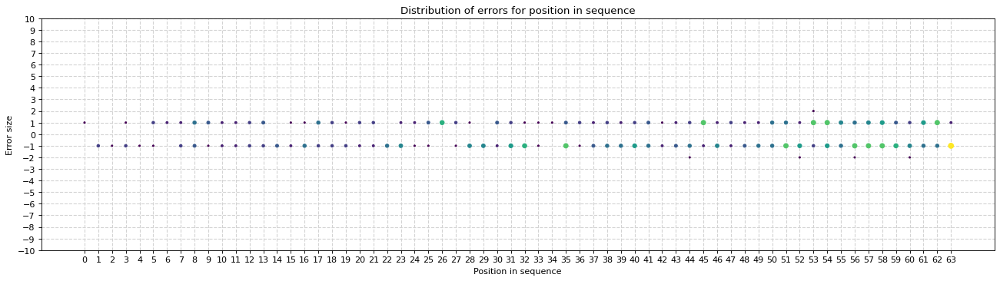

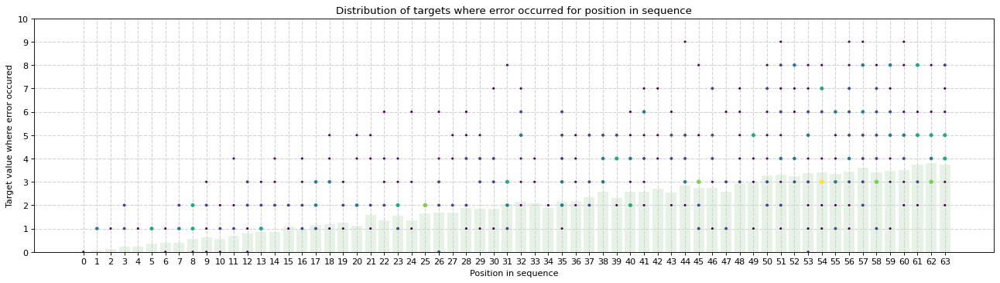

step 2500 out of 5000
loss train 0.13374421000480652
accuracy test 0.9432373046875

step 2550 out of 5000
loss train 0.21057139337062836
accuracy test 0.941162109375

step 2600 out of 5000
loss train 0.19231323897838593
accuracy test 0.930419921875

step 2650 out of 5000
loss train 0.1721188873052597
accuracy test 0.94287109375

step 2700 out of 5000
loss train 0.17608825862407684
accuracy test 0.9388427734375

step 2750 out of 5000
loss train 0.14339877665042877
accuracy test 0.9456787109375

step 2800 out of 5000
loss train 0.12238072603940964
accuracy test 0.9488525390625

step 2850 out of 5000
loss train 0.13519681990146637
accuracy test 0.945556640625

step 2900 out of 5000
loss train 0.1552906334400177
accuracy test 0.9427490234375

step 2950 out of 5000
loss train 0.12351837754249573
accuracy test 0.9417724609375



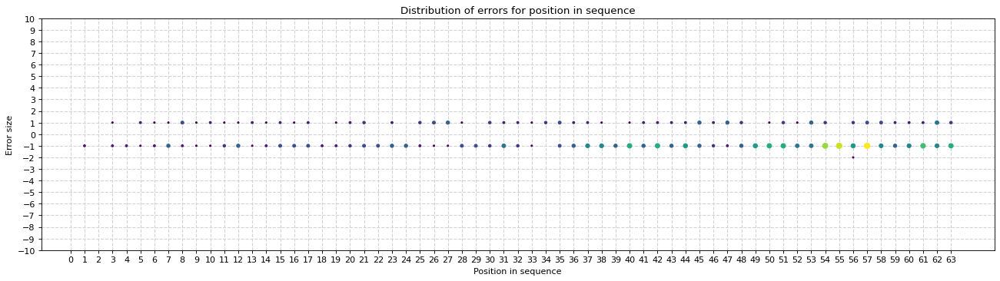

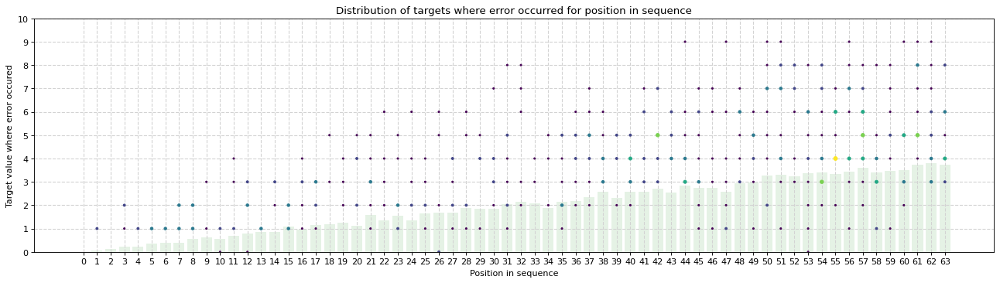

step 3000 out of 5000
loss train 0.11853110790252686
accuracy test 0.9478759765625

step 3050 out of 5000
loss train 0.14638525247573853
accuracy test 0.9478759765625

step 3100 out of 5000
loss train 0.13816715776920319
accuracy test 0.9571533203125

step 3150 out of 5000
loss train 0.11817675083875656
accuracy test 0.953125

step 3200 out of 5000
loss train 0.10666859149932861
accuracy test 0.95263671875

step 3250 out of 5000
loss train 0.13457763195037842
accuracy test 0.9598388671875

step 3300 out of 5000
loss train 0.08540775626897812
accuracy test 0.9571533203125

step 3350 out of 5000
loss train 0.10015600919723511
accuracy test 0.9539794921875

step 3400 out of 5000
loss train 0.09940459579229355
accuracy test 0.9635009765625

step 3450 out of 5000
loss train 0.10339336097240448
accuracy test 0.9649658203125



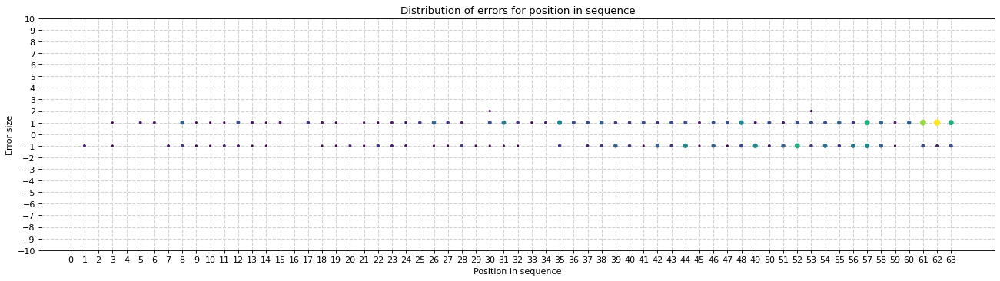

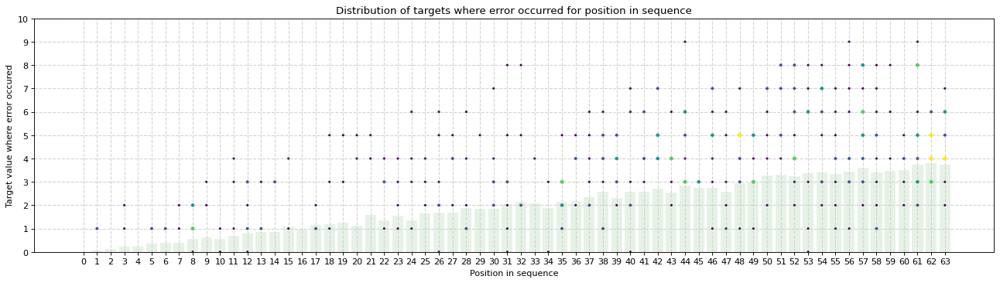

step 3500 out of 5000
loss train 0.11471614986658096
accuracy test 0.9571533203125

step 3550 out of 5000
loss train 0.08078203350305557
accuracy test 0.9688720703125

step 3600 out of 5000
loss train 0.11868973821401596
accuracy test 0.9605712890625

step 3650 out of 5000
loss train 0.08622070401906967
accuracy test 0.962158203125

step 3700 out of 5000
loss train 0.09187500923871994
accuracy test 0.9630126953125

step 3750 out of 5000
loss train 0.11457494646310806
accuracy test 0.9674072265625

step 3800 out of 5000
loss train 0.09196958690881729
accuracy test 0.9635009765625

step 3850 out of 5000
loss train 0.0957576110959053
accuracy test 0.9683837890625

step 3900 out of 5000
loss train 0.07844850420951843
accuracy test 0.966552734375

step 3950 out of 5000
loss train 0.11991677433252335
accuracy test 0.9708251953125



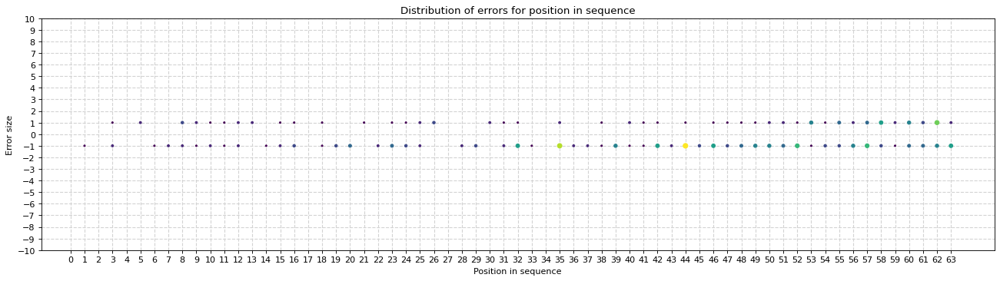

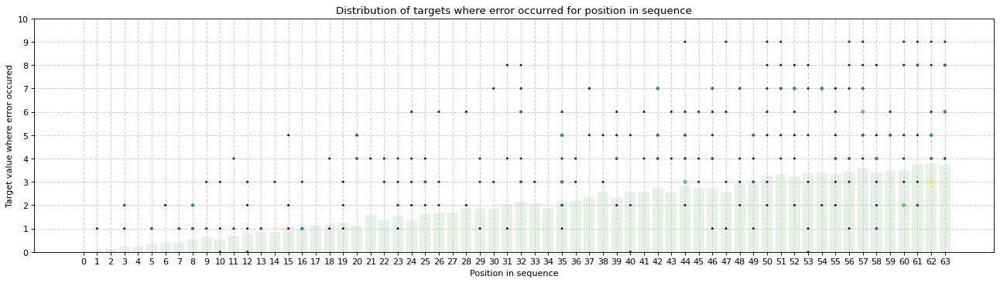

step 4000 out of 5000
loss train 0.06995103508234024
accuracy test 0.9683837890625

step 4050 out of 5000
loss train 0.12832091748714447
accuracy test 0.9573974609375

step 4100 out of 5000
loss train 0.0902341976761818
accuracy test 0.967041015625

step 4150 out of 5000
loss train 0.06972439587116241
accuracy test 0.968505859375

step 4200 out of 5000
loss train 0.13259856402873993
accuracy test 0.9715576171875

step 4250 out of 5000
loss train 0.06456209719181061
accuracy test 0.9635009765625

step 4300 out of 5000
loss train 0.09561055153608322
accuracy test 0.97412109375

step 4350 out of 5000
loss train 0.08815411478281021
accuracy test 0.974365234375

step 4400 out of 5000
loss train 0.09198476374149323
accuracy test 0.959716796875

step 4450 out of 5000
loss train 0.11770307272672653
accuracy test 0.9468994140625



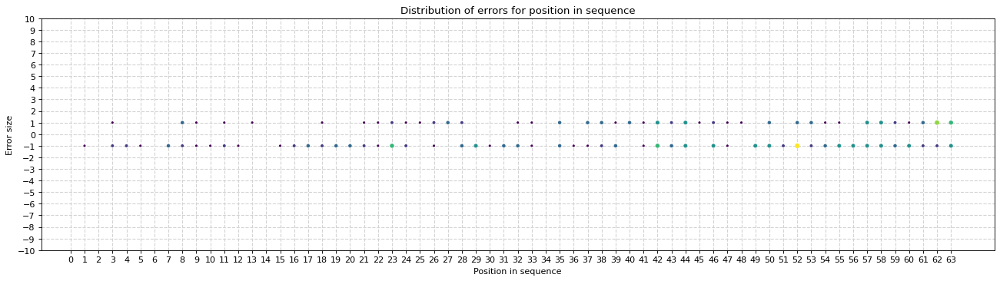

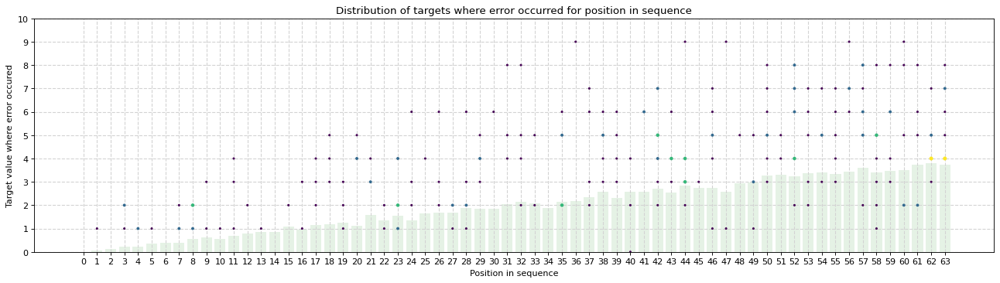

step 4500 out of 5000
loss train 0.08387666940689087
accuracy test 0.9725341796875

step 4550 out of 5000
loss train 0.06508819013834
accuracy test 0.97314453125

step 4600 out of 5000
loss train 0.07796484231948853
accuracy test 0.978271484375

step 4650 out of 5000
loss train 0.06229493021965027
accuracy test 0.9761962890625

step 4700 out of 5000
loss train 0.09087618440389633
accuracy test 0.9744873046875

step 4750 out of 5000
loss train 0.0668107196688652
accuracy test 0.958740234375

step 4800 out of 5000
loss train 0.08261138945817947
accuracy test 0.978515625

step 4850 out of 5000
loss train 0.07934479415416718
accuracy test 0.9635009765625

step 4900 out of 5000
loss train 0.08233346790075302
accuracy test 0.9630126953125

step 4950 out of 5000
loss train 0.13190196454524994
accuracy test 0.975341796875



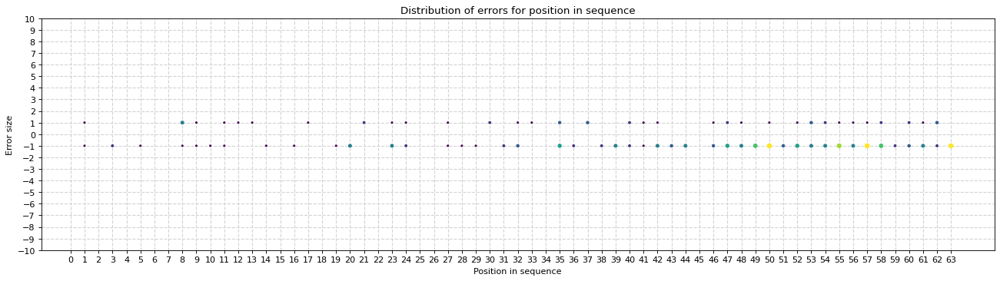

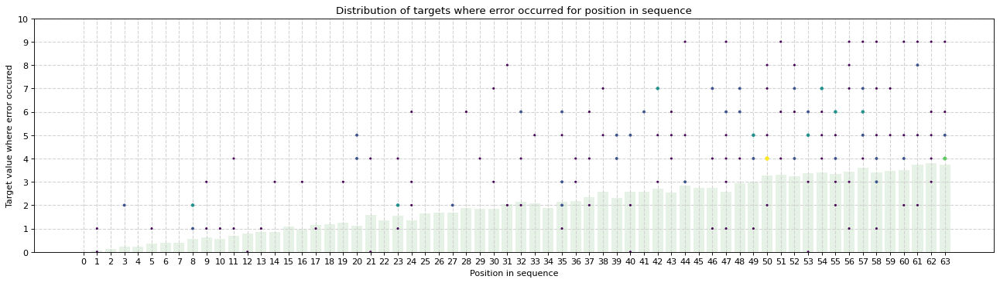

step 4999 out of 5000
loss train 0.0861765667796135
accuracy test 0.9764404296875


TRAINING TIME: 126.4290406703949


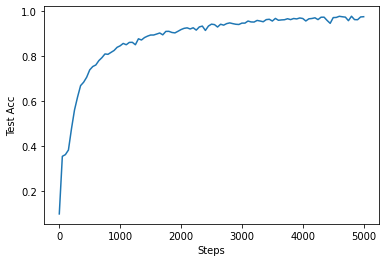

#################################################################################################### EXAMPLE 1 ####################################################################################################
Sequence:
[9, 14, 8, 1, 9, 6, 15, 14, 10, 12, 7, 10, 7, 9, 13, 13, 8, 4, 11, 10, 5, 0, 13, 8, 1, 4, 4, 14, 14, 0, 8, 0, 7, 11, 9, 7, 14, 8, 4, 11, 8, 12, 2, 0, 13, 15, 11, 15, 15, 0, 9, 9, 6, 10, 4, 12, 13, 1, 1, 1, 5, 5, 2, 14]
Prediction:
[0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 2, 0, 1, 1, 0, 0, 2, 0, 0, 2, 2, 1, 1, 2, 2, 3, 1, 3, 2, 2, 1, 3, 3, 4, 4, 3, 2, 5, 1, 0, 3, 3, 1, 3, 2, 3, 4, 4, 5, 1, 3, 4, 3, 4, 2, 3, 4, 1, 2, 1, 5]
Target:
[0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 2, 0, 1, 1, 0, 0, 2, 0, 0, 2, 2, 1, 1, 2, 2, 3, 1, 3, 2, 2, 1, 3, 3, 4, 4, 3, 2, 5, 1, 0, 3, 3, 1, 3, 2, 3, 4, 4, 5, 1, 3, 4, 2, 4, 2, 3, 4, 1, 2, 1, 5] 

#################################################################################################### EXAMPLE 2 ########################################

In [10]:
HIDDEN_DIM = 64
FF_DIM = 2048
N_HEADS = 4
N_LAYERS = 4

BATCH_SIZE = 32
LR = 0.0001
NUM_STEPS = 5000

model_wo_feedforward = EncoderModel(N_TOKENS, HIDDEN_DIM, FF_DIM, OUTPUT_DIM, N_LAYERS, N_HEADS, use_feedforward=False)
accs = train_model(model_wo_feedforward, LR, NUM_STEPS, BATCH_SIZE, plot_errors=True)
plt.plot([i * NUM_STEPS/(len(accs)-1) for i in range(len(accs))], accs)
plt.xlabel('Steps')
plt.ylabel('Test Acc')
plt.show()

print_examples(model_wo_feedforward)

### Model without Attention layer.

*For this experiment I decreased the number of steps to 1000 since for greater values there is no improvement to loss, nor accuracy.*

Here, as plots and examples show, the model learns the mean target value per position in sequence since it's not aware of token values at different positions.


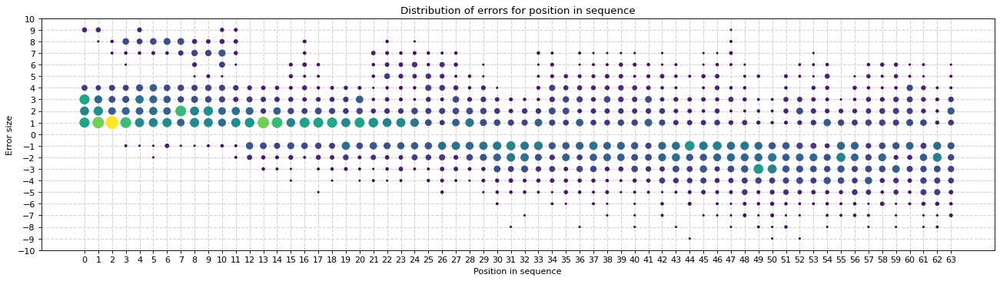

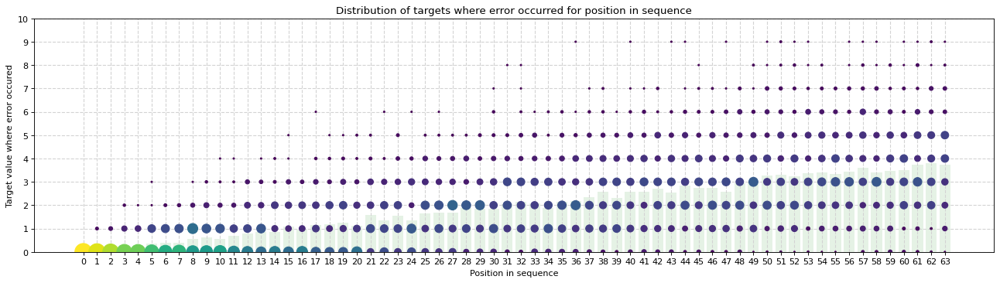

step 0 out of 1000
loss train 2.5726847648620605
accuracy test 0.150634765625

step 10 out of 1000
loss train 1.7861948013305664
accuracy test 0.3160400390625

step 20 out of 1000
loss train 1.6244010925292969
accuracy test 0.3455810546875

step 30 out of 1000
loss train 1.5956529378890991
accuracy test 0.3577880859375

step 40 out of 1000
loss train 1.4932610988616943
accuracy test 0.35888671875

step 50 out of 1000
loss train 1.5470097064971924
accuracy test 0.3553466796875

step 60 out of 1000
loss train 1.482866883277893
accuracy test 0.357666015625

step 70 out of 1000
loss train 1.5850070714950562
accuracy test 0.3609619140625

step 80 out of 1000
loss train 1.559630274772644
accuracy test 0.3585205078125

step 90 out of 1000
loss train 1.5626401901245117
accuracy test 0.356201171875



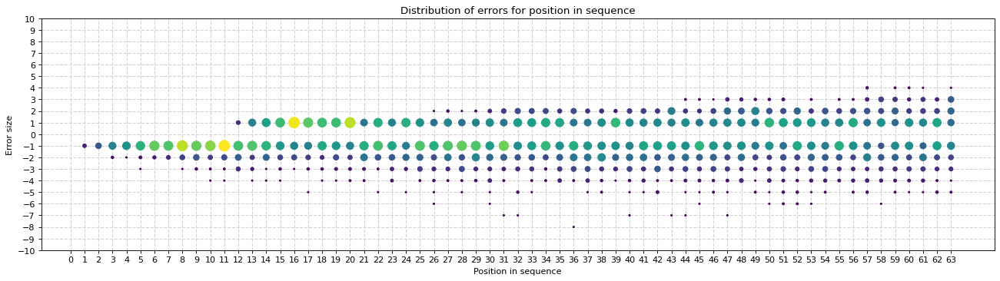

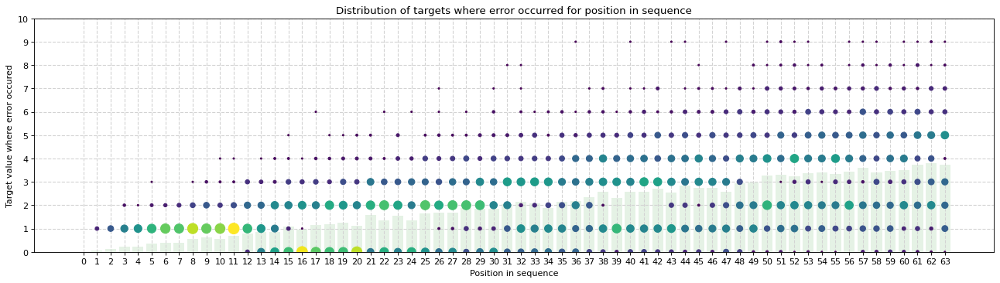

step 100 out of 1000
loss train 1.5660183429718018
accuracy test 0.35546875

step 110 out of 1000
loss train 1.5696001052856445
accuracy test 0.357177734375

step 120 out of 1000
loss train 1.5150562524795532
accuracy test 0.35693359375

step 130 out of 1000
loss train 1.540114402770996
accuracy test 0.359375

step 140 out of 1000
loss train 1.5357345342636108
accuracy test 0.3555908203125

step 150 out of 1000
loss train 1.521575927734375
accuracy test 0.359130859375

step 160 out of 1000
loss train 1.525817632675171
accuracy test 0.3577880859375

step 170 out of 1000
loss train 1.5422284603118896
accuracy test 0.3568115234375

step 180 out of 1000
loss train 1.5069580078125
accuracy test 0.359130859375

step 190 out of 1000
loss train 1.5706684589385986
accuracy test 0.3563232421875



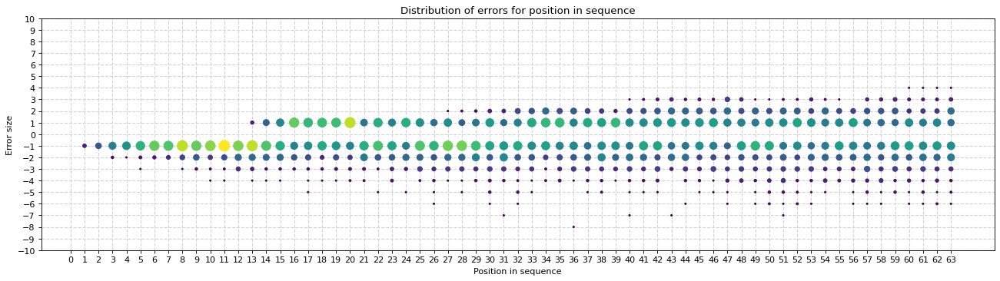

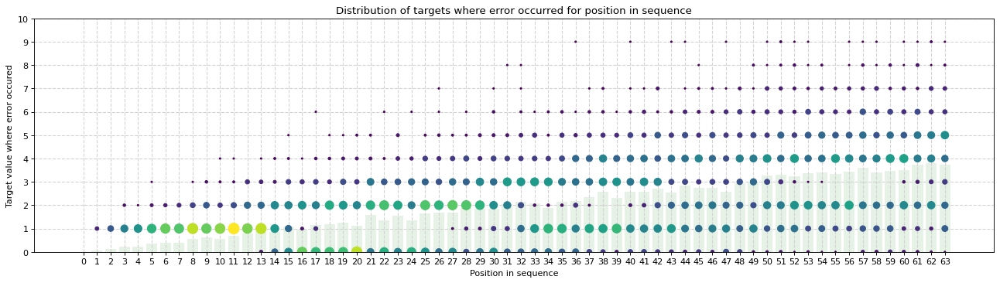

step 200 out of 1000
loss train 1.5752125978469849
accuracy test 0.356689453125

step 210 out of 1000
loss train 1.5626648664474487
accuracy test 0.3572998046875

step 220 out of 1000
loss train 1.4996930360794067
accuracy test 0.359375

step 230 out of 1000
loss train 1.4959009885787964
accuracy test 0.354736328125

step 240 out of 1000
loss train 1.5273783206939697
accuracy test 0.35888671875

step 250 out of 1000
loss train 1.4928449392318726
accuracy test 0.3555908203125

step 260 out of 1000
loss train 1.5180139541625977
accuracy test 0.3612060546875

step 270 out of 1000
loss train 1.555333137512207
accuracy test 0.354248046875

step 280 out of 1000
loss train 1.5188367366790771
accuracy test 0.361083984375

step 290 out of 1000
loss train 1.5281788110733032
accuracy test 0.3583984375



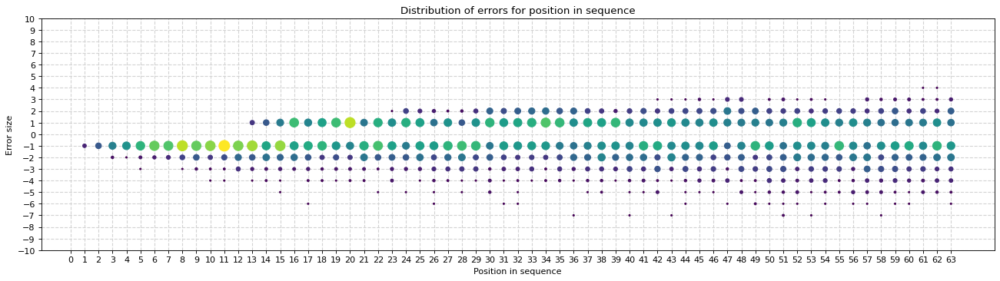

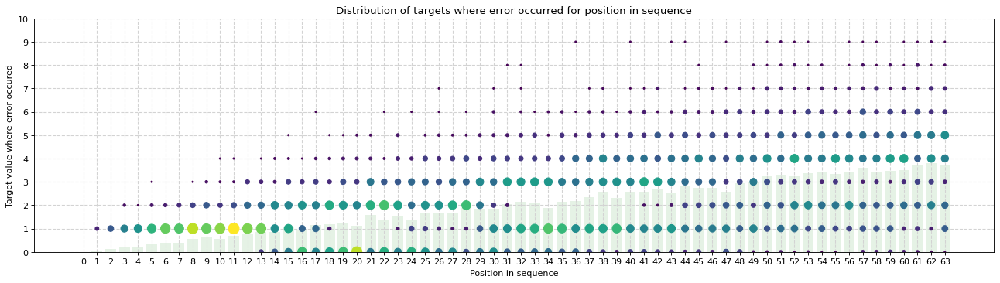

step 300 out of 1000
loss train 1.5618125200271606
accuracy test 0.3563232421875

step 310 out of 1000
loss train 1.5288163423538208
accuracy test 0.3594970703125

step 320 out of 1000
loss train 1.5541985034942627
accuracy test 0.3577880859375

step 330 out of 1000
loss train 1.5337333679199219
accuracy test 0.3544921875

step 340 out of 1000
loss train 1.4896330833435059
accuracy test 0.360107421875

step 350 out of 1000
loss train 1.5360212326049805
accuracy test 0.3582763671875

step 360 out of 1000
loss train 1.5754785537719727
accuracy test 0.35400390625

step 370 out of 1000
loss train 1.5117837190628052
accuracy test 0.3604736328125

step 380 out of 1000
loss train 1.520961046218872
accuracy test 0.3602294921875

step 390 out of 1000
loss train 1.508239507675171
accuracy test 0.360595703125



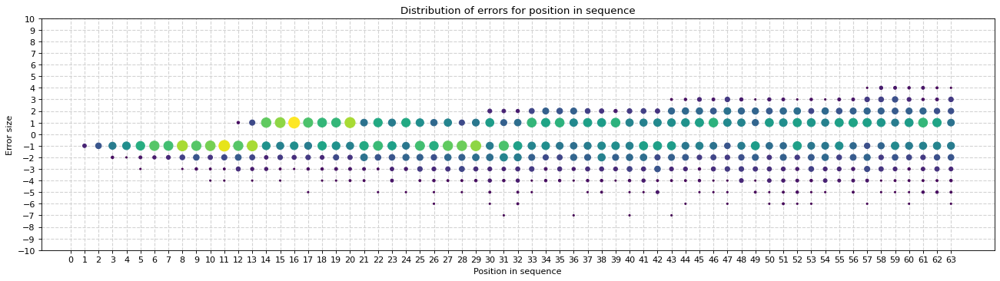

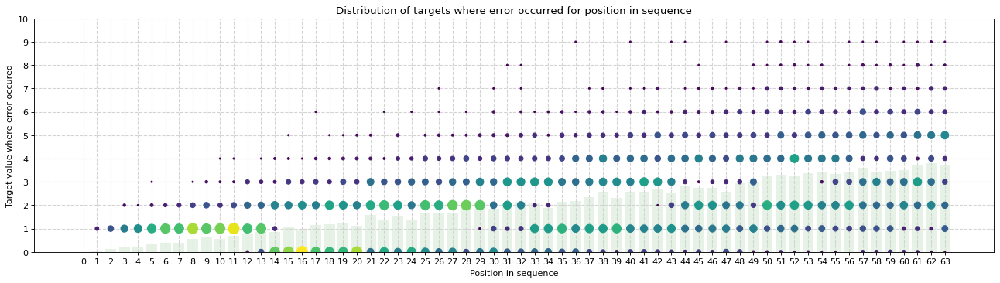

step 400 out of 1000
loss train 1.523161768913269
accuracy test 0.3515625

step 410 out of 1000
loss train 1.5470319986343384
accuracy test 0.353271484375

step 420 out of 1000
loss train 1.5129796266555786
accuracy test 0.358642578125

step 430 out of 1000
loss train 1.4982295036315918
accuracy test 0.357666015625

step 440 out of 1000
loss train 1.6238991022109985
accuracy test 0.3585205078125

step 450 out of 1000
loss train 1.4769459962844849
accuracy test 0.3597412109375

step 460 out of 1000
loss train 1.562044620513916
accuracy test 0.36083984375

step 470 out of 1000
loss train 1.5124139785766602
accuracy test 0.3594970703125

step 480 out of 1000
loss train 1.4899903535842896
accuracy test 0.359619140625

step 490 out of 1000
loss train 1.5046992301940918
accuracy test 0.3572998046875



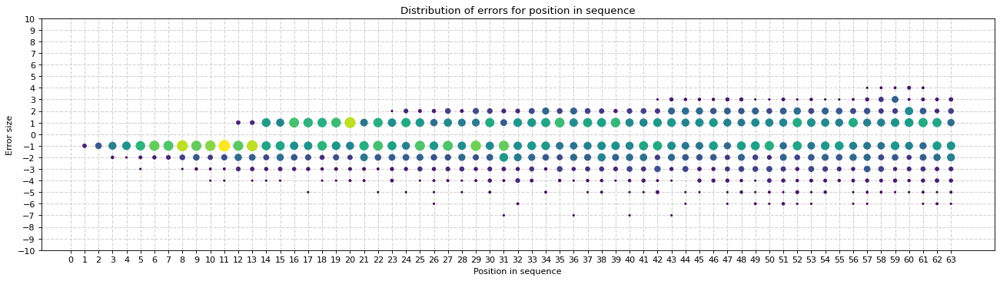

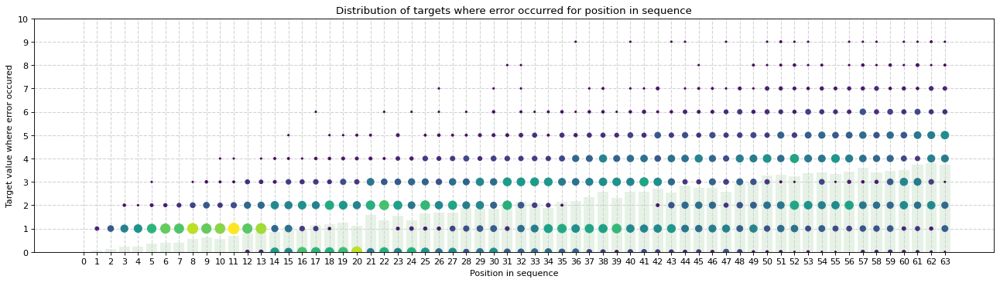

step 500 out of 1000
loss train 1.5240813493728638
accuracy test 0.355224609375

step 510 out of 1000
loss train 1.4852203130722046
accuracy test 0.35546875

step 520 out of 1000
loss train 1.5395481586456299
accuracy test 0.35791015625

step 530 out of 1000
loss train 1.4853063821792603
accuracy test 0.3614501953125

step 540 out of 1000
loss train 1.5601387023925781
accuracy test 0.357666015625

step 550 out of 1000
loss train 1.565274953842163
accuracy test 0.35888671875

step 560 out of 1000
loss train 1.524902105331421
accuracy test 0.3553466796875

step 570 out of 1000
loss train 1.5505597591400146
accuracy test 0.356689453125

step 580 out of 1000
loss train 1.5254433155059814
accuracy test 0.3621826171875

step 590 out of 1000
loss train 1.5189642906188965
accuracy test 0.3603515625



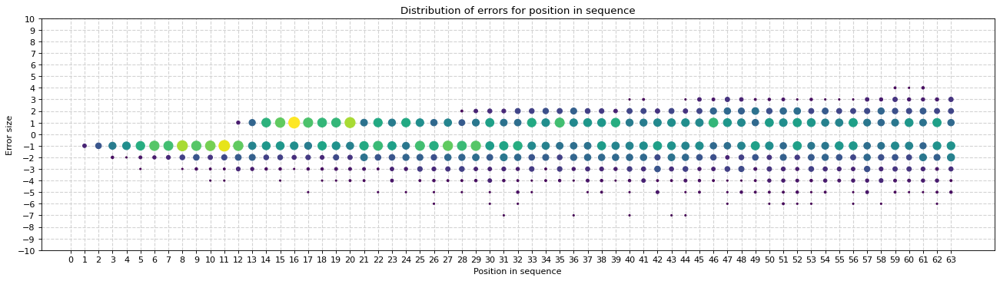

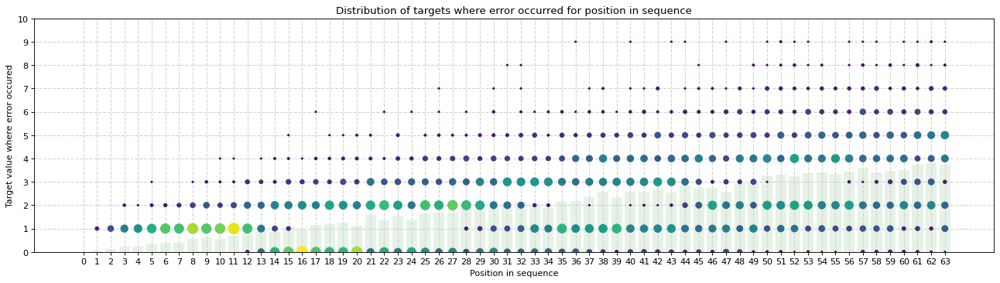

step 600 out of 1000
loss train 1.495715856552124
accuracy test 0.359375

step 610 out of 1000
loss train 1.5195515155792236
accuracy test 0.35986328125

step 620 out of 1000
loss train 1.5488978624343872
accuracy test 0.3553466796875

step 630 out of 1000
loss train 1.5435028076171875
accuracy test 0.353515625

step 640 out of 1000
loss train 1.5049939155578613
accuracy test 0.356201171875

step 650 out of 1000
loss train 1.5622003078460693
accuracy test 0.358642578125

step 660 out of 1000
loss train 1.4999678134918213
accuracy test 0.3616943359375

step 670 out of 1000
loss train 1.5166822671890259
accuracy test 0.35400390625

step 680 out of 1000
loss train 1.4853782653808594
accuracy test 0.358642578125

step 690 out of 1000
loss train 1.536278486251831
accuracy test 0.3604736328125



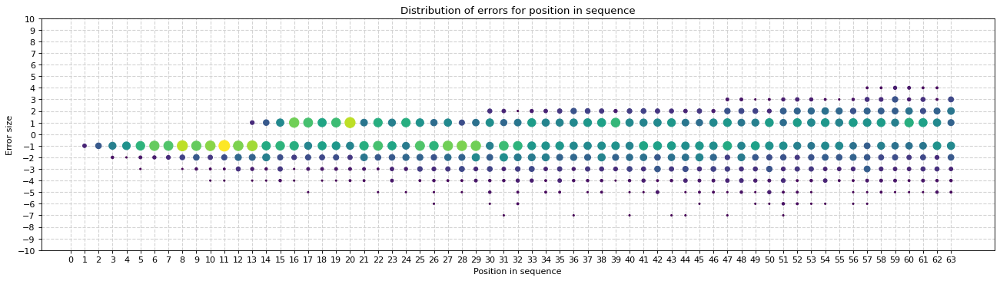

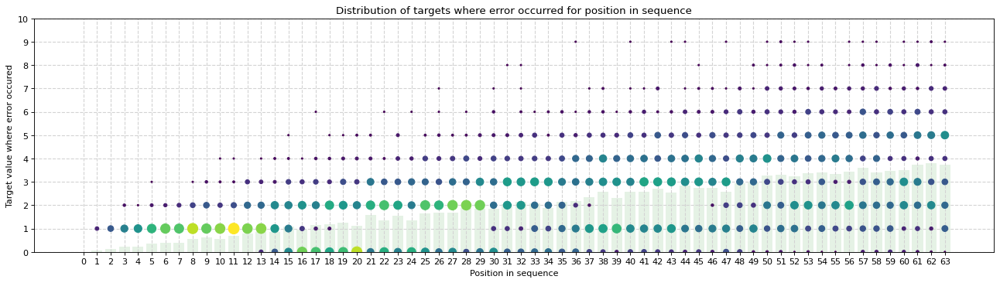

step 700 out of 1000
loss train 1.532844066619873
accuracy test 0.3590087890625

step 710 out of 1000
loss train 1.5288593769073486
accuracy test 0.3563232421875

step 720 out of 1000
loss train 1.500859022140503
accuracy test 0.3583984375

step 730 out of 1000
loss train 1.52969229221344
accuracy test 0.36083984375

step 740 out of 1000
loss train 1.4840574264526367
accuracy test 0.357666015625

step 750 out of 1000
loss train 1.5363409519195557
accuracy test 0.3564453125

step 760 out of 1000
loss train 1.5165468454360962
accuracy test 0.361083984375

step 770 out of 1000
loss train 1.522705316543579
accuracy test 0.3563232421875

step 780 out of 1000
loss train 1.5599960088729858
accuracy test 0.3590087890625

step 790 out of 1000
loss train 1.5468765497207642
accuracy test 0.358642578125



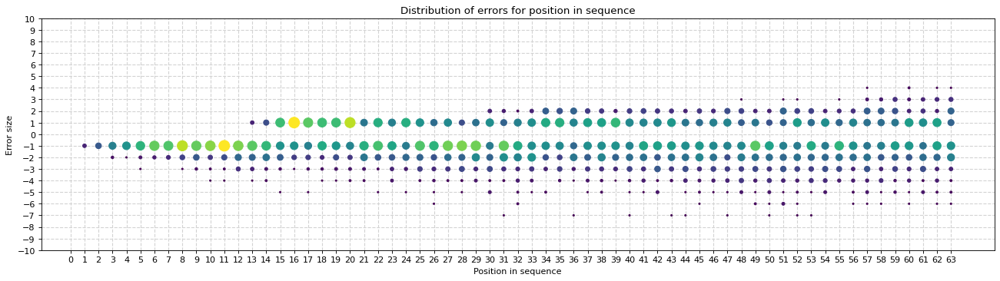

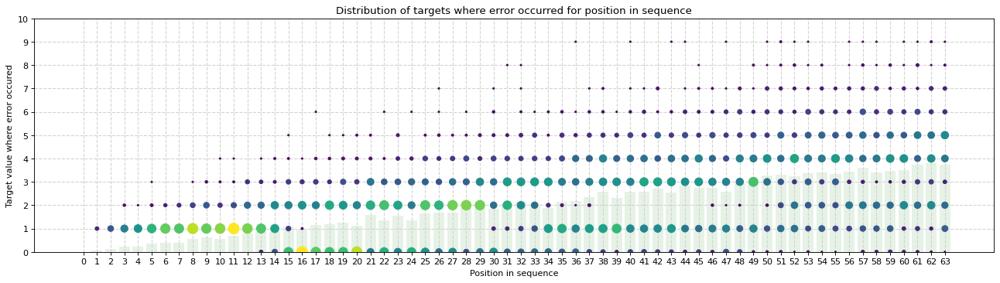

step 800 out of 1000
loss train 1.5185928344726562
accuracy test 0.35986328125

step 810 out of 1000
loss train 1.503858208656311
accuracy test 0.3583984375

step 820 out of 1000
loss train 1.5264098644256592
accuracy test 0.3585205078125

step 830 out of 1000
loss train 1.5157384872436523
accuracy test 0.3634033203125

step 840 out of 1000
loss train 1.5479360818862915
accuracy test 0.3564453125

step 850 out of 1000
loss train 1.504098653793335
accuracy test 0.359130859375

step 860 out of 1000
loss train 1.5747740268707275
accuracy test 0.3599853515625

step 870 out of 1000
loss train 1.5819575786590576
accuracy test 0.35498046875

step 880 out of 1000
loss train 1.5325406789779663
accuracy test 0.361328125

step 890 out of 1000
loss train 1.564395785331726
accuracy test 0.35791015625



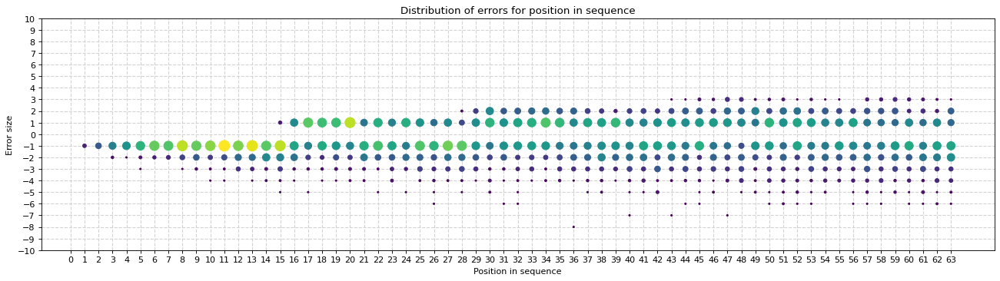

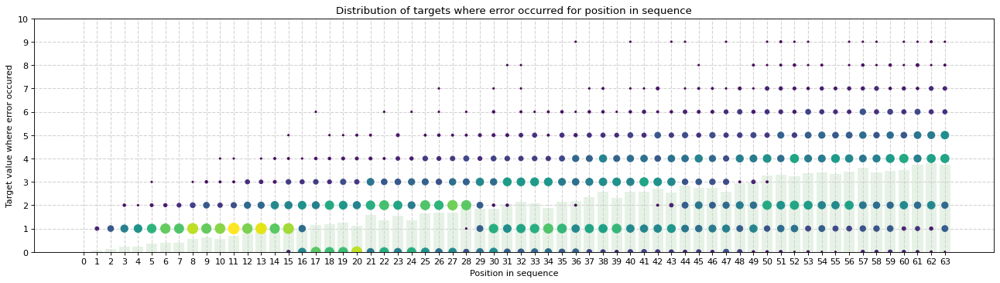

step 900 out of 1000
loss train 1.522464632987976
accuracy test 0.3602294921875

step 910 out of 1000
loss train 1.5183279514312744
accuracy test 0.3568115234375

step 920 out of 1000
loss train 1.5575144290924072
accuracy test 0.3568115234375

step 930 out of 1000
loss train 1.5272959470748901
accuracy test 0.3565673828125

step 940 out of 1000
loss train 1.5246217250823975
accuracy test 0.3602294921875

step 950 out of 1000
loss train 1.4914085865020752
accuracy test 0.35791015625

step 960 out of 1000
loss train 1.5402154922485352
accuracy test 0.3525390625

step 970 out of 1000
loss train 1.5169317722320557
accuracy test 0.359375

step 980 out of 1000
loss train 1.5333642959594727
accuracy test 0.3638916015625

step 990 out of 1000
loss train 1.5151355266571045
accuracy test 0.358154296875



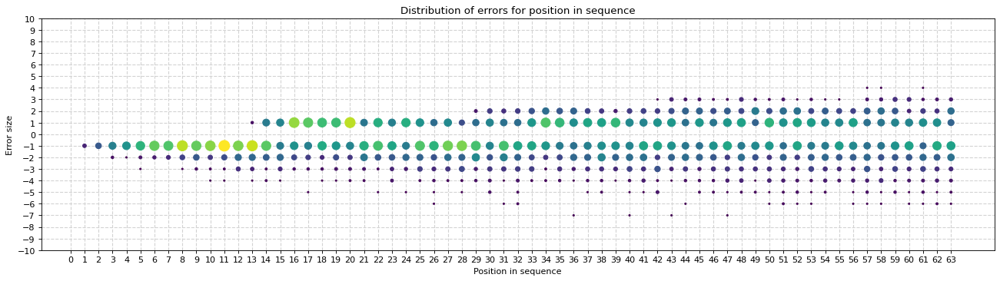

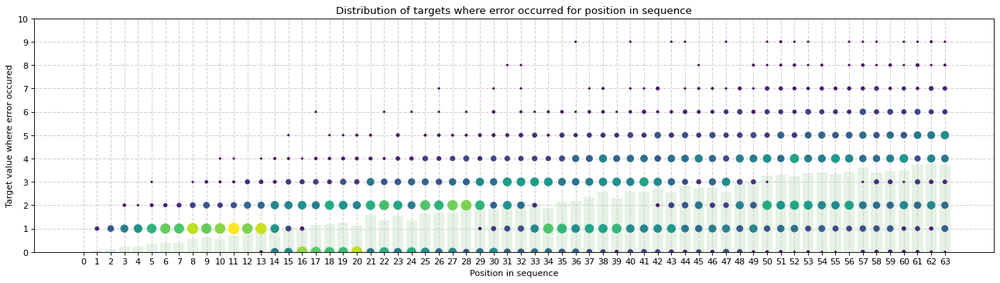

step 999 out of 1000
loss train 1.5353801250457764
accuracy test 0.3603515625


TRAINING TIME: 40.657543420791626


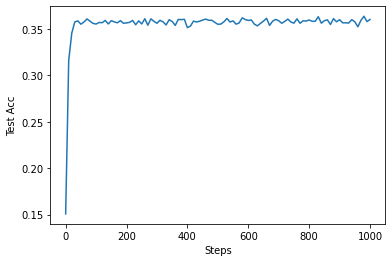

#################################################################################################### EXAMPLE 1 ####################################################################################################
Sequence:
[5, 2, 0, 3, 10, 0, 3, 8, 7, 15, 15, 5, 8, 8, 14, 14, 15, 8, 4, 7, 12, 7, 5, 13, 7, 15, 2, 3, 13, 2, 9, 11, 2, 3, 0, 0, 9, 10, 15, 12, 1, 15, 14, 13, 13, 3, 13, 2, 2, 5, 9, 2, 14, 0, 13, 12, 11, 7, 5, 1, 3, 13, 6, 0]
Prediction:
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4]
Target:
[0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 2, 0, 1, 2, 3, 0, 1, 0, 2, 2, 0, 3, 3, 1, 2, 1, 2, 0, 0, 3, 3, 2, 3, 1, 1, 4, 1, 0, 5, 2, 2, 3, 4, 4, 4, 5, 3, 2, 6, 3, 4, 5, 2, 1, 4, 4, 1, 5, 6, 0, 5] 

#################################################################################################### EXAMPLE 2 ##########################################

In [11]:
HIDDEN_DIM = 64
FF_DIM = 2048
N_HEADS = 4
N_LAYERS = 4

BATCH_SIZE = 32
LR = 0.0001
NUM_STEPS = 1000

model_wo_att = EncoderModel(N_TOKENS, HIDDEN_DIM, FF_DIM, OUTPUT_DIM, N_LAYERS, N_HEADS, use_attention=False)
accs = train_model(model_wo_att, LR, NUM_STEPS, BATCH_SIZE, plot_errors=True)
plt.plot([i * NUM_STEPS/(len(accs)-1) for i in range(len(accs))], accs)
plt.xlabel('Steps')
plt.ylabel('Test Acc')
plt.show()

print_examples(model_wo_att)

## Attention weights visualizations

### Preparation

For visualizing the attention weights I divided the length of the sequence and number of different possible tokens by 2.


In [12]:
N_TOKENS = 8
SEQ_LEN = 32

TEST_SIZE = 128

test_examples = [get_single_example() for i in range(TEST_SIZE)]

# Transpositions are used, because the convention in PyTorch is to represent
# sequence tensors as <seq_len, batch_size> instead of <batch_size, seq_len>.
test_X = torch.tensor([x[0] for x in test_examples],
                      device=DEVICE).transpose(0, 1)
test_Y = torch.tensor([x[1] for x in test_examples],
                      device=DEVICE).transpose(0, 1)

### Visualizations

I expected attention weights to be much lower towards the end of the sequence, and generally to have a lower-left corner triangular shape, but that doesn't seem to be the case. Also, it is interesting to see how attention heads in consecutive encoding layers are getting more and more specialized.


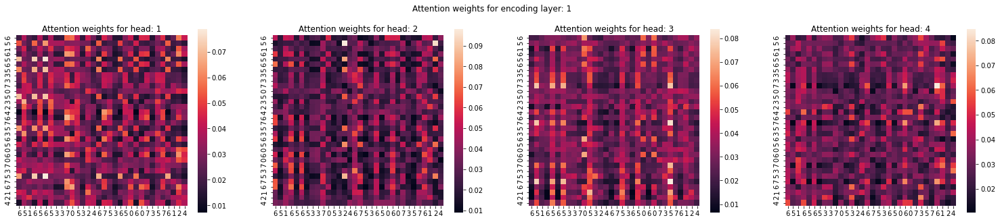

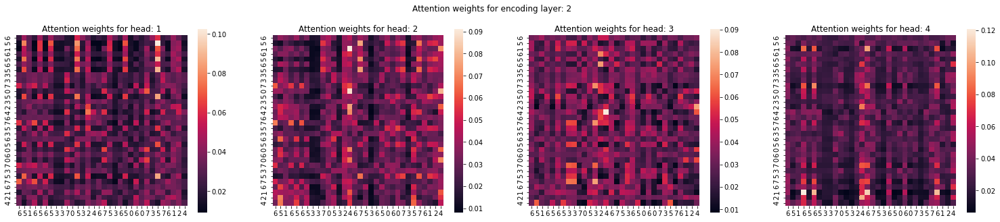

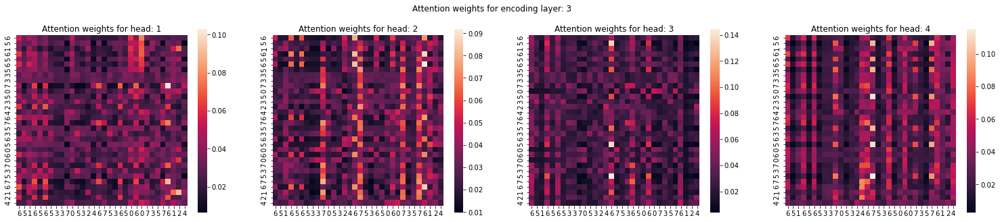

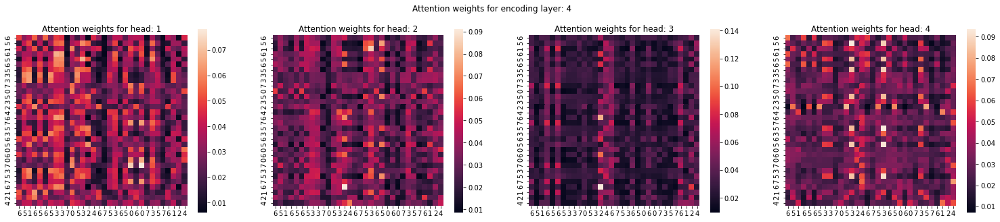

step 0 out of 3000
loss train 2.2672410011291504
accuracy test 0.234375

step 30 out of 3000
loss train 1.481906771659851
accuracy test 0.353271484375

step 60 out of 3000
loss train 1.467846393585205
accuracy test 0.367919921875

step 90 out of 3000
loss train 1.3686515092849731
accuracy test 0.40185546875

step 120 out of 3000
loss train 1.161895990371704
accuracy test 0.5029296875

step 150 out of 3000
loss train 1.0071803331375122
accuracy test 0.568115234375

step 180 out of 3000
loss train 0.9044803380966187
accuracy test 0.630859375

step 210 out of 3000
loss train 0.7434093952178955
accuracy test 0.65087890625

step 240 out of 3000
loss train 0.7356606125831604
accuracy test 0.685791015625

step 270 out of 3000
loss train 0.6409991383552551
accuracy test 0.712646484375



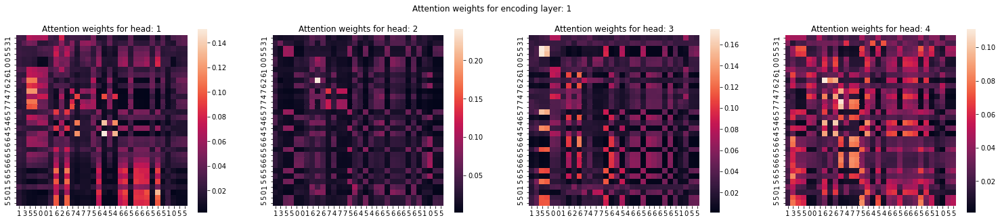

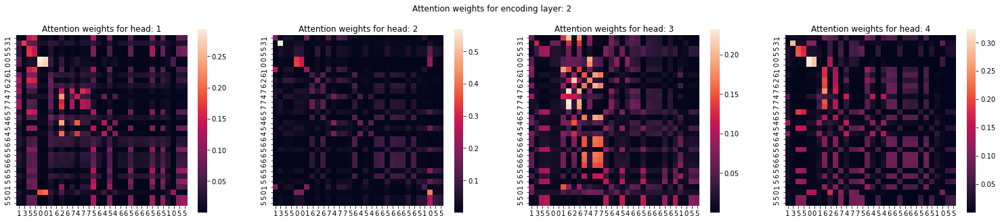

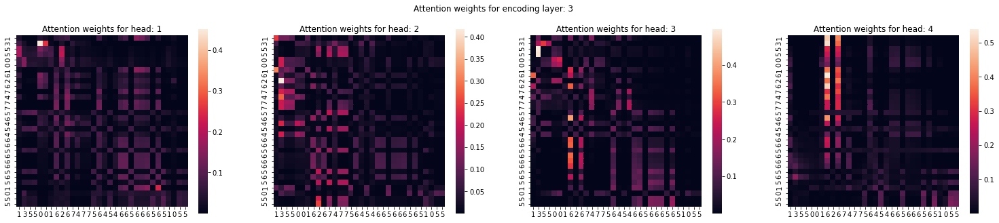

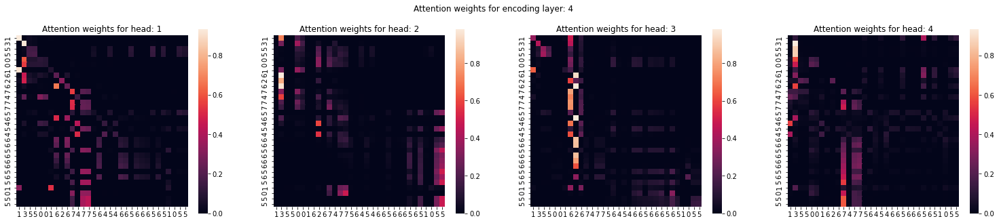

step 300 out of 3000
loss train 0.6535759568214417
accuracy test 0.720458984375

step 330 out of 3000
loss train 0.5933671593666077
accuracy test 0.680908203125

step 360 out of 3000
loss train 0.5482171177864075
accuracy test 0.76708984375

step 390 out of 3000
loss train 0.5138007402420044
accuracy test 0.775146484375

step 420 out of 3000
loss train 0.5935168266296387
accuracy test 0.774658203125

step 450 out of 3000
loss train 0.46137621998786926
accuracy test 0.806884765625

step 480 out of 3000
loss train 0.4492480754852295
accuracy test 0.79345703125

step 510 out of 3000
loss train 0.4082828164100647
accuracy test 0.804443359375

step 540 out of 3000
loss train 0.40940171480178833
accuracy test 0.84033203125

step 570 out of 3000
loss train 0.35745787620544434
accuracy test 0.807373046875



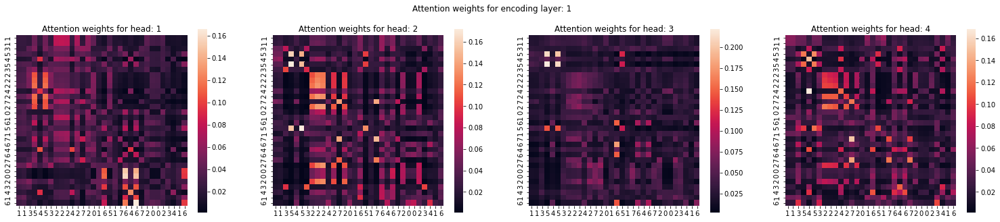

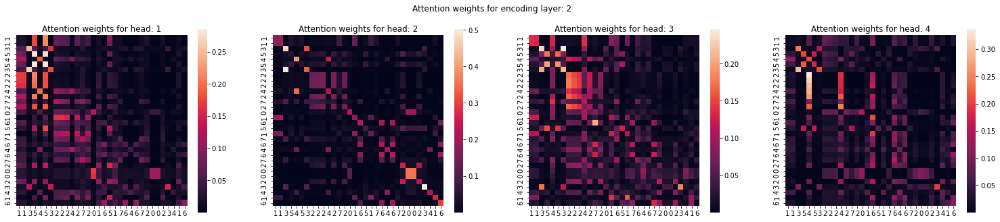

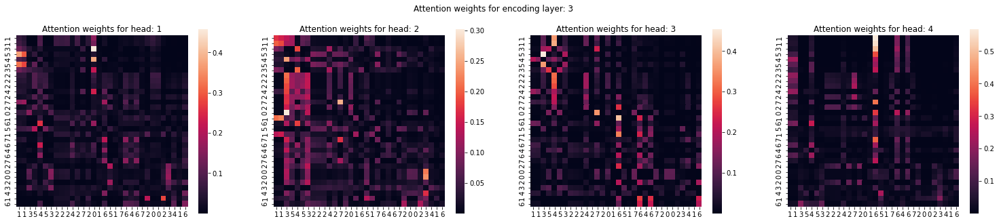

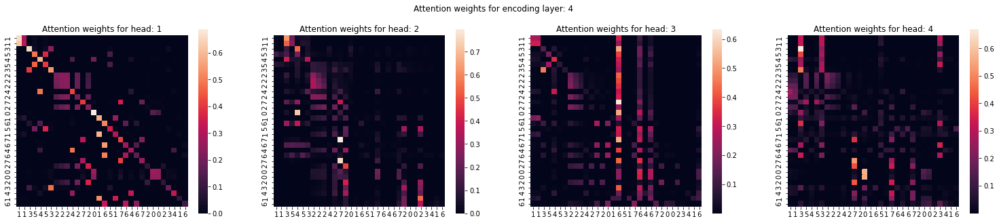

step 600 out of 3000
loss train 0.37015774846076965
accuracy test 0.84228515625

step 630 out of 3000
loss train 0.33470621705055237
accuracy test 0.8486328125

step 660 out of 3000
loss train 0.3521346151828766
accuracy test 0.855224609375

step 690 out of 3000
loss train 0.27027976512908936
accuracy test 0.86962890625

step 720 out of 3000
loss train 0.29321038722991943
accuracy test 0.838134765625

step 750 out of 3000
loss train 0.2567186653614044
accuracy test 0.87744140625

step 780 out of 3000
loss train 0.23738987743854523
accuracy test 0.875732421875

step 810 out of 3000
loss train 0.2748529314994812
accuracy test 0.873291015625

step 840 out of 3000
loss train 0.3297087848186493
accuracy test 0.87744140625

step 870 out of 3000
loss train 0.20862020552158356
accuracy test 0.9111328125



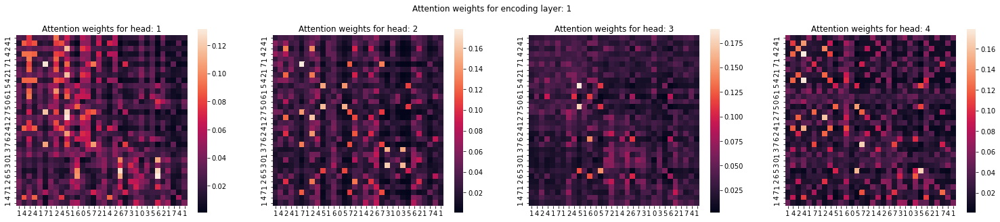

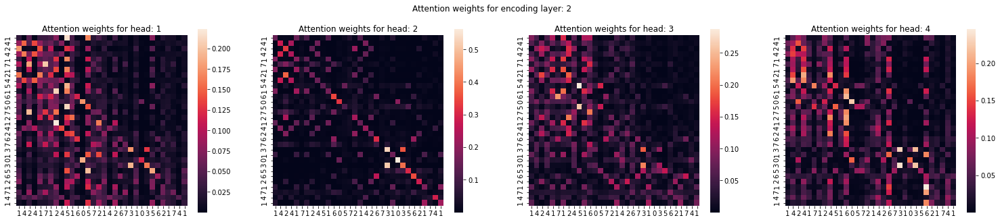

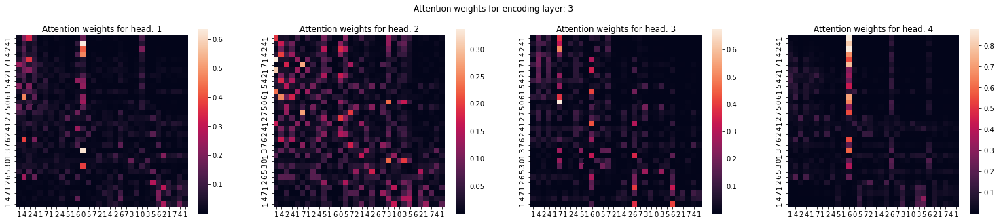

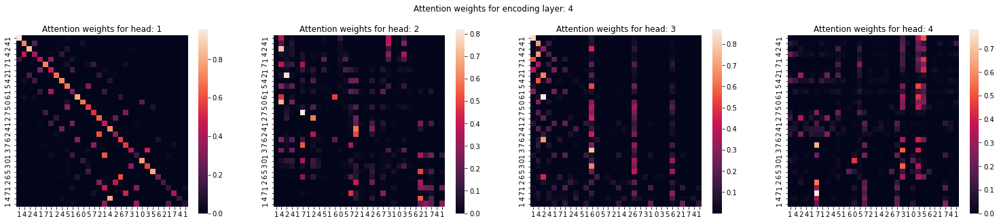

step 900 out of 3000
loss train 0.21664397418498993
accuracy test 0.916748046875

step 930 out of 3000
loss train 0.2710861265659332
accuracy test 0.900634765625

step 960 out of 3000
loss train 0.24836289882659912
accuracy test 0.921875

step 990 out of 3000
loss train 0.1947583258152008
accuracy test 0.9296875

step 1020 out of 3000
loss train 0.17868301272392273
accuracy test 0.923828125

step 1050 out of 3000
loss train 0.1753062903881073
accuracy test 0.937255859375

step 1080 out of 3000
loss train 0.1626688539981842
accuracy test 0.92578125

step 1110 out of 3000
loss train 0.16423089802265167
accuracy test 0.94189453125

step 1140 out of 3000
loss train 0.1991283893585205
accuracy test 0.94091796875

step 1170 out of 3000
loss train 0.17197836935520172
accuracy test 0.934814453125



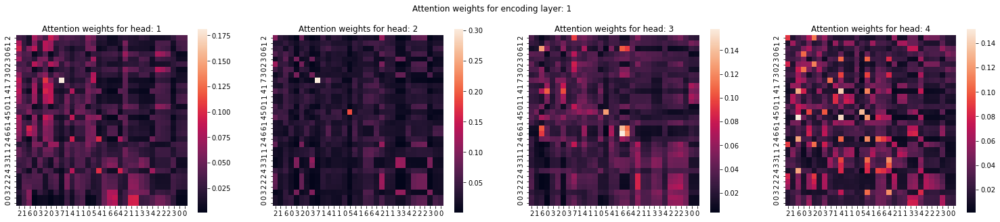

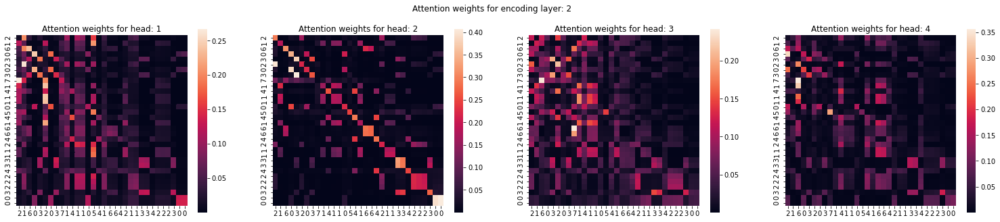

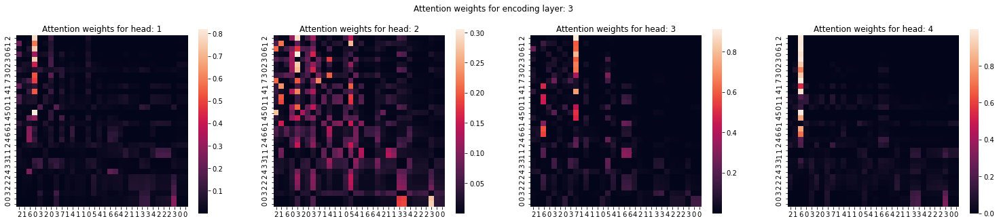

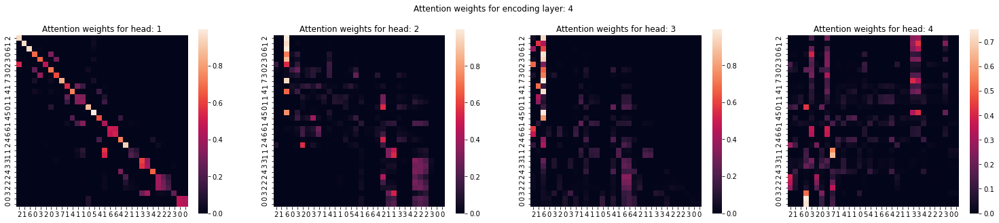

step 1200 out of 3000
loss train 0.12301824241876602
accuracy test 0.95361328125

step 1230 out of 3000
loss train 0.15229547023773193
accuracy test 0.941162109375

step 1260 out of 3000
loss train 0.23126891255378723
accuracy test 0.947509765625

step 1290 out of 3000
loss train 0.11469516158103943
accuracy test 0.955078125

step 1320 out of 3000
loss train 0.1085294783115387
accuracy test 0.953125

step 1350 out of 3000
loss train 0.1488545835018158
accuracy test 0.94873046875

step 1380 out of 3000
loss train 0.12276793271303177
accuracy test 0.94091796875

step 1410 out of 3000
loss train 0.11342038214206696
accuracy test 0.95458984375

step 1440 out of 3000
loss train 0.08485932648181915
accuracy test 0.9638671875

step 1470 out of 3000
loss train 0.0907263457775116
accuracy test 0.958740234375



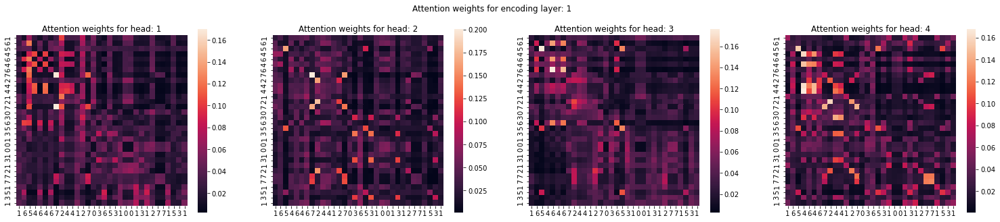

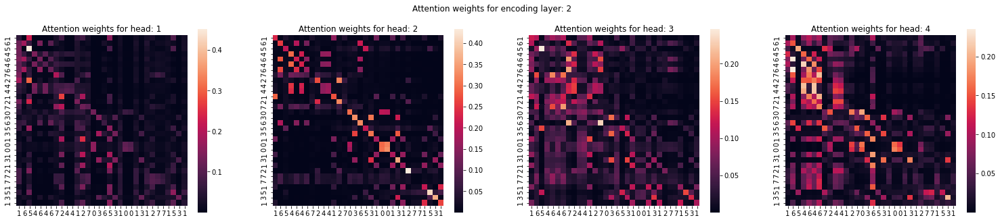

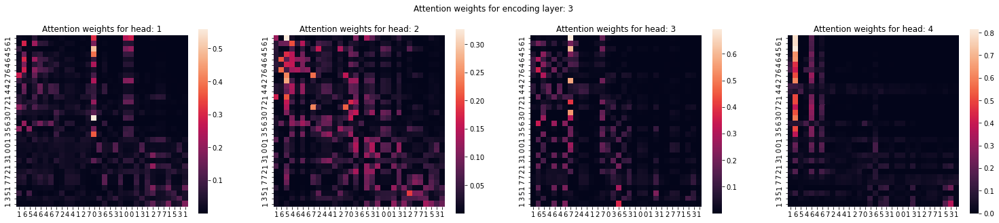

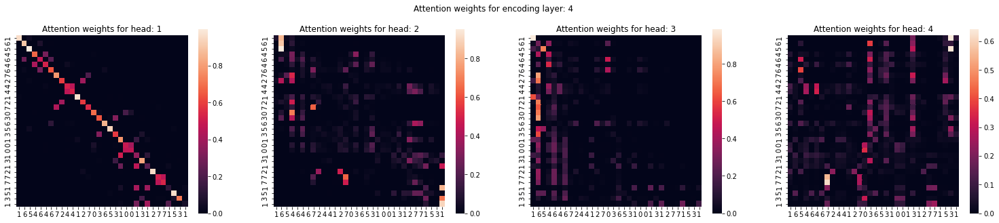

step 1500 out of 3000
loss train 0.1311580091714859
accuracy test 0.9560546875

step 1530 out of 3000
loss train 0.0826132670044899
accuracy test 0.9462890625

step 1560 out of 3000
loss train 0.08368755877017975
accuracy test 0.96875

step 1590 out of 3000
loss train 0.0702076107263565
accuracy test 0.964111328125

step 1620 out of 3000
loss train 0.07686734199523926
accuracy test 0.962646484375

step 1650 out of 3000
loss train 0.11336978524923325
accuracy test 0.948974609375

step 1680 out of 3000
loss train 0.09494712203741074
accuracy test 0.976318359375

step 1710 out of 3000
loss train 0.06922388821840286
accuracy test 0.9560546875

step 1740 out of 3000
loss train 0.07779783010482788
accuracy test 0.969970703125

step 1770 out of 3000
loss train 0.06454061716794968
accuracy test 0.974609375



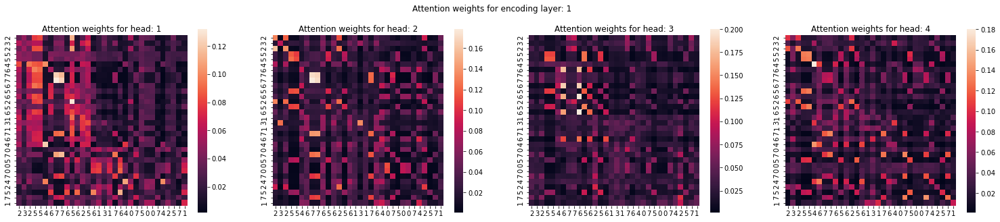

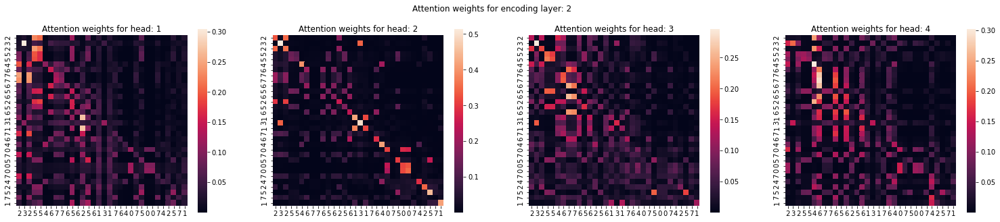

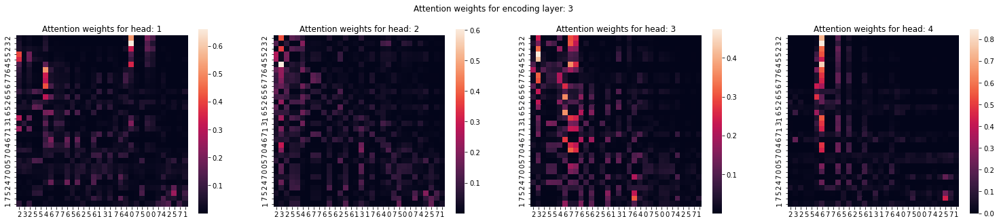

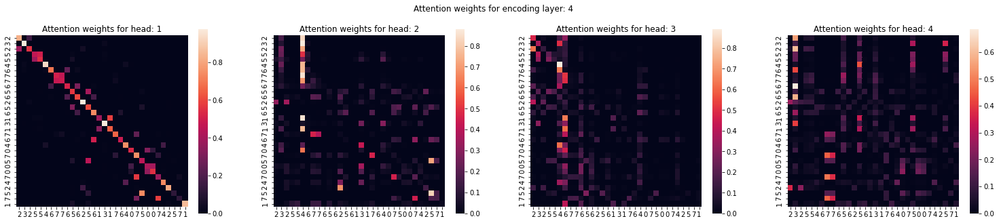

step 1800 out of 3000
loss train 0.10541325062513351
accuracy test 0.960205078125

step 1830 out of 3000
loss train 0.07714125514030457
accuracy test 0.974853515625

step 1860 out of 3000
loss train 0.06424403935670853
accuracy test 0.970947265625

step 1890 out of 3000
loss train 0.10630244761705399
accuracy test 0.96923828125

step 1920 out of 3000
loss train 0.6540082097053528
accuracy test 0.70361328125

step 1950 out of 3000
loss train 0.17108894884586334
accuracy test 0.933349609375

step 1980 out of 3000
loss train 0.11547230184078217
accuracy test 0.958740234375

step 2010 out of 3000
loss train 0.10742589831352234
accuracy test 0.966796875

step 2040 out of 3000
loss train 0.10364794731140137
accuracy test 0.97021484375

step 2070 out of 3000
loss train 0.0879826620221138
accuracy test 0.97509765625



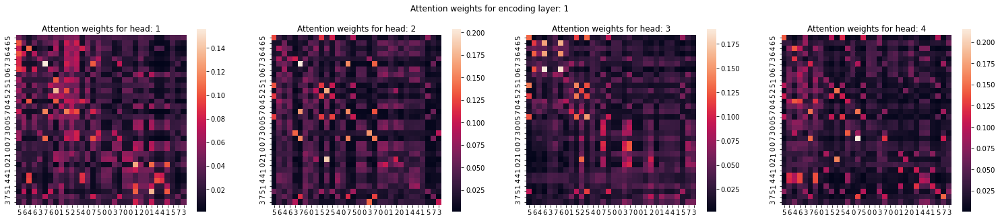

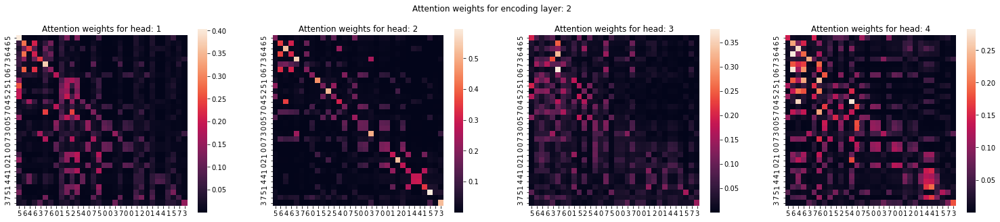

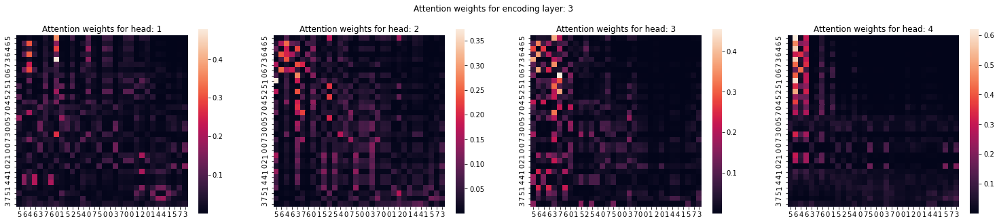

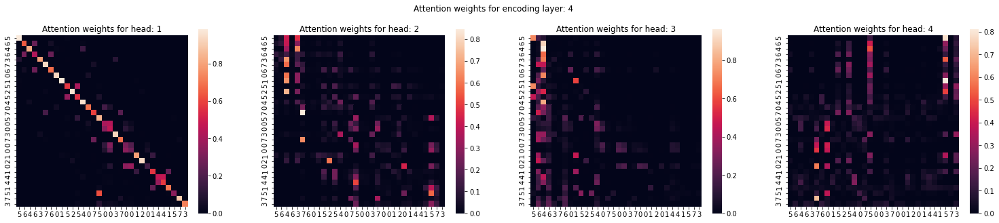

step 2100 out of 3000
loss train 0.0977853313088417
accuracy test 0.979736328125

step 2130 out of 3000
loss train 0.07854768633842468
accuracy test 0.9775390625

step 2160 out of 3000
loss train 0.05755501985549927
accuracy test 0.979248046875

step 2190 out of 3000
loss train 0.07278604060411453
accuracy test 0.975341796875

step 2220 out of 3000
loss train 0.08326753973960876
accuracy test 0.9814453125

step 2250 out of 3000
loss train 0.05634364113211632
accuracy test 0.9794921875

step 2280 out of 3000
loss train 0.07800812274217606
accuracy test 0.97900390625

step 2310 out of 3000
loss train 0.07944375276565552
accuracy test 0.96044921875

step 2340 out of 3000
loss train 0.06747299432754517
accuracy test 0.981201171875

step 2370 out of 3000
loss train 0.03462771698832512
accuracy test 0.982421875



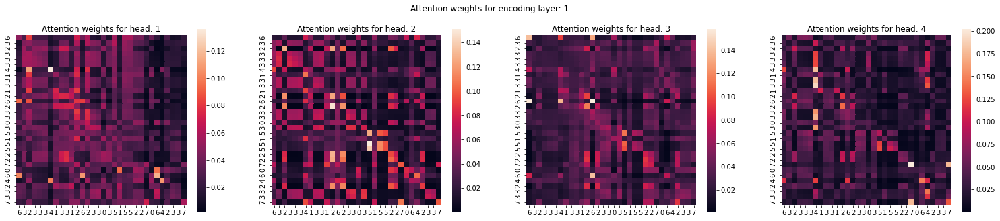

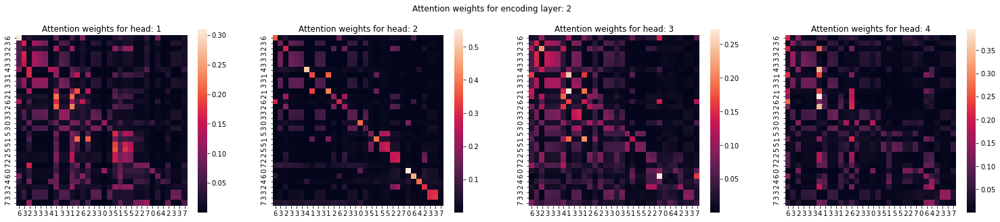

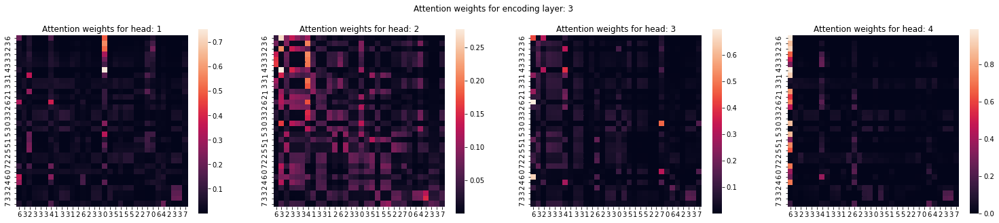

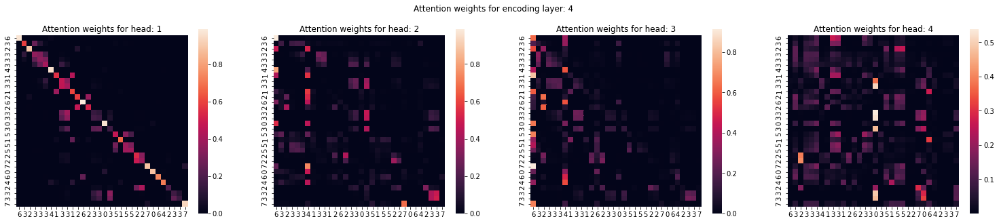

step 2400 out of 3000
loss train 0.04514171928167343
accuracy test 0.978271484375

step 2430 out of 3000
loss train 0.07211034744977951
accuracy test 0.9775390625

step 2460 out of 3000
loss train 0.06150034815073013
accuracy test 0.971923828125

step 2490 out of 3000
loss train 0.058428697288036346
accuracy test 0.98095703125

step 2520 out of 3000
loss train 0.06630899757146835
accuracy test 0.958984375

step 2550 out of 3000
loss train 0.047384366393089294
accuracy test 0.98486328125

step 2580 out of 3000
loss train 0.037053339183330536
accuracy test 0.983642578125

step 2610 out of 3000
loss train 0.04207709804177284
accuracy test 0.974853515625

step 2640 out of 3000
loss train 0.048912543803453445
accuracy test 0.97412109375

step 2670 out of 3000
loss train 0.04116850718855858
accuracy test 0.978271484375



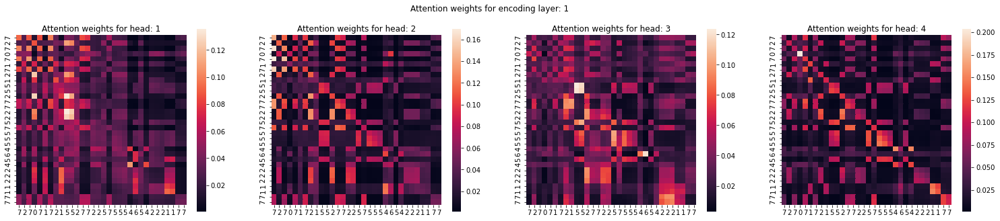

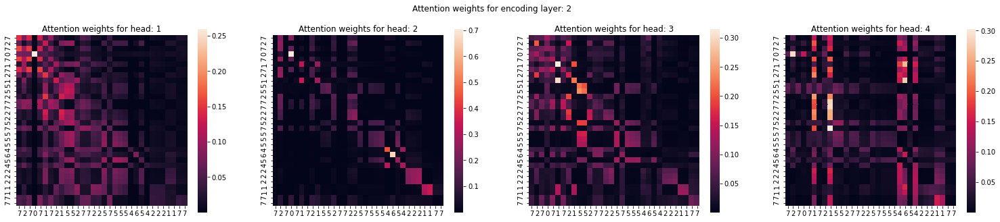

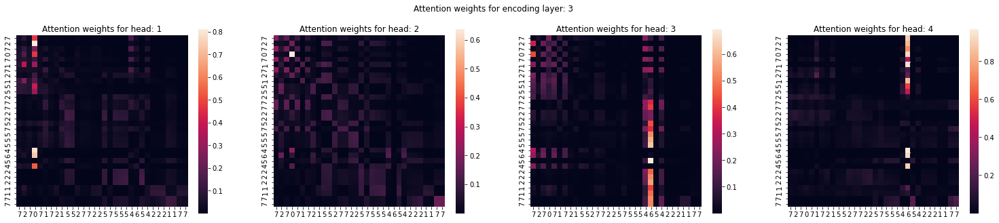

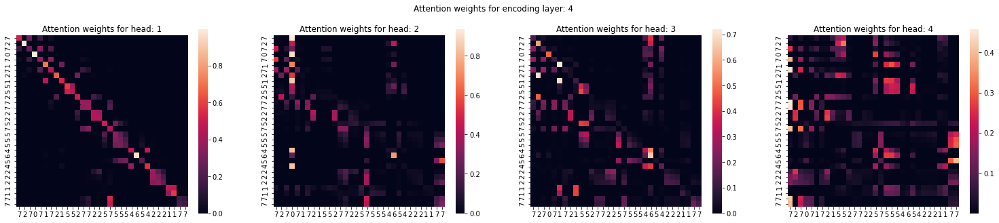

step 2700 out of 3000
loss train 0.03948112577199936
accuracy test 0.98486328125

step 2730 out of 3000
loss train 0.04365849122405052
accuracy test 0.976318359375

step 2760 out of 3000
loss train 0.03131162375211716
accuracy test 0.988037109375

step 2790 out of 3000
loss train 0.04127883166074753
accuracy test 0.97998046875

step 2820 out of 3000
loss train 0.03327791020274162
accuracy test 0.972412109375

step 2850 out of 3000
loss train 0.0518425814807415
accuracy test 0.96826171875

step 2880 out of 3000
loss train 0.05372290685772896
accuracy test 0.987548828125

step 2910 out of 3000
loss train 0.03975257650017738
accuracy test 0.989501953125

step 2940 out of 3000
loss train 0.03039446286857128
accuracy test 0.9853515625

step 2970 out of 3000
loss train 0.030021730810403824
accuracy test 0.989501953125



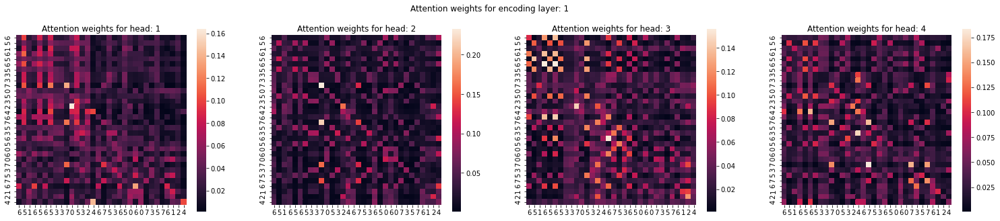

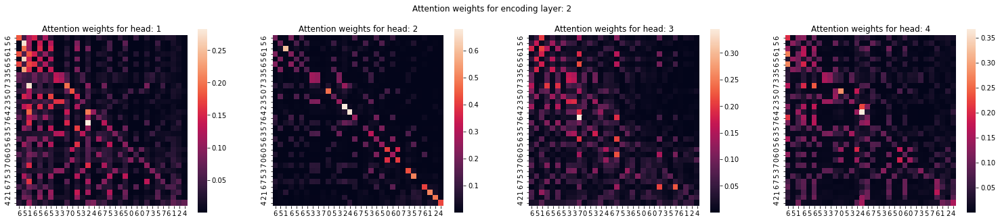

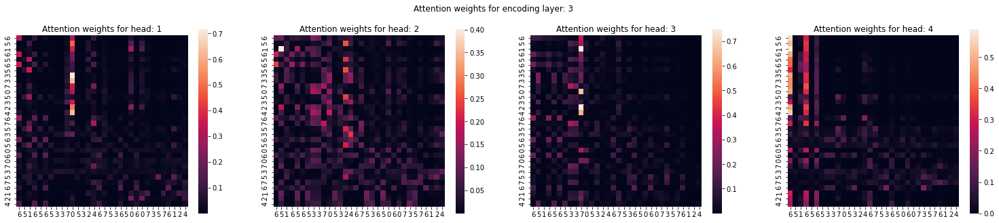

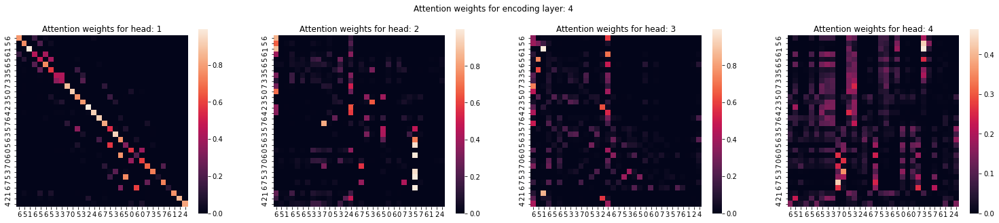

step 2999 out of 3000
loss train 0.03676898032426834
accuracy test 0.984619140625


TRAINING TIME: 150.32099843025208


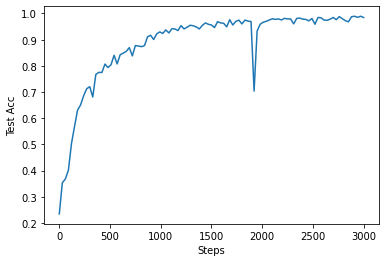

In [13]:
HIDDEN_DIM = 32
FF_DIM = 2048
N_HEADS = 4
N_LAYERS = 4

BATCH_SIZE = 32
LR = 0.0001
NUM_STEPS = 3000

simpler_model = EncoderModel(N_TOKENS, HIDDEN_DIM, FF_DIM, OUTPUT_DIM, N_LAYERS, N_HEADS)
accs = train_model(simpler_model, LR, NUM_STEPS, BATCH_SIZE, plot_att_weights=True)
plt.plot([i * NUM_STEPS/(len(accs)-1) for i in range(len(accs))], accs)
plt.xlabel('Steps')
plt.ylabel('Test Acc')
plt.show()